In [1]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
import numpy as np
import seaborn as sns
from mpl_toolkits.basemap import Basemap
colors = np.array(['darkturquoise', 'coral', 'skyblue', 'gold', 'lightgreen', 'green', 'mediumaquamarine',  'pink', 'deepskyblue',  'lightsteelblue', 'blue', 'navy', 'rebeccapurple', 'mediumorchid', 'hotpink', 'red','crimson', 'dimgrey'])

In [2]:
df= pd.read_csv('testdata.csv')
# get rid of multiple charges from the same event
df1 = df.drop_duplicates(["f_addr"], keep="first")

# get rid of obvious errors/outliers
df1 = df[(df['x_lng'] > -88.0676) & (df['x_lng'] < -87.8640)
               & (df['y_lat'] > 42.9197) & (df['y_lat'] < 43.1953)]

# add boolean column for guilty/nonguilty
def getVal(s):
    return 1 if s == 'Guilty' or s == 'Guilty - Suspended Sentence' else 0
df1['guilty'] = df.apply(lambda row: getVal(row['j_finding']), axis=1)


C:\Users\Dominique\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':


In [3]:
# a function that separate year and month into two different column
def getYear(s):
    return pd.to_numeric(s[0:4])
def getMonth(s):
    return pd.to_numeric(s[5:7])

df1['year'] = df1.apply(lambda row: getYear(row['c_violation_date']), axis=1) 
df1['month'] = df1.apply(lambda row: getMonth(row['c_violation_date']), axis=1)
df1.head()

C:\Users\Dominique\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
C:\Users\Dominique\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,g_case_no,y_lat,x_lng,f_addr,gf_addr,c_case_type,c_violation,c_violation_date,j_finding,guilty,year,month
0,11000001,43.091474,-87.984090,"5700 W CAPITOL DR MILWAUKEE, WI","5700 W Capitol Dr, Milwaukee, WI 53216, USA",Municipal citation,"Ordinance 110-35-1, Retail Theft",2011-01-03 14:40:00.000000,Guilty,1,2011,1
1,11000002,43.068454,-87.918139,"2736 N 6TH ST MILWAUKEE, WI","2736 N 6th St, Milwaukee, WI 53212, USA",Municipal citation,"Ordinance 105-138-2, Resisting / Obstructing P...",2011-01-03 16:00:00.000000,Guilty,1,2011,1
2,11000009,43.122443,-88.014475,"8223 W THURSTON AVE MILWAUKEE, WI","8223 W Thurston Ave, Milwaukee, WI 53218, USA",Summons & Complaint,"Ordinance 200 through 295, Building Code Viola...",2010-05-07 00:00:00.000000,Guilty,1,2010,5
3,11000014,43.056875,-87.941243,"2020 N 23 ST MILWAUKEE, WI","2020 N 23rd St, Milwaukee, WI 53205, USA",Summons & Complaint,"Ordinance 200 through 295, Building Code Viola...",2010-06-08 00:00:00.000000,Guilty,1,2010,6
4,11000024,43.054717,-87.936219,"1840 N 19 ST MILWAUKEE, WI","1840 N 19th St, Milwaukee, WI 53205, USA",Summons & Complaint,"Ordinance 200 through 295, Building Code Viola...",2010-03-30 00:00:00.000000,Guilty,1,2010,3


# GaussianMixture
<br>1. Initialization which is choose random examples  from the dataset  as initial centroids and that’s simply because it does not know yet where the center of each cluster is. <br>2. E-step which for each point, find weights encoding the probability of membership in each cluster.<br>3. M-step which for each cluster, update its location, normalization, and shape based on all data points, making use of the weights. <br>4. Repeat step 2 and 3 until converged

Expectation maximization (EM) is seemingly the most popular technique used to determine the parameters of a mixture with an a priori given number of components. This is a particular way of implementing maximum likelihood estimation for this problem.

3 CLUSTERS:


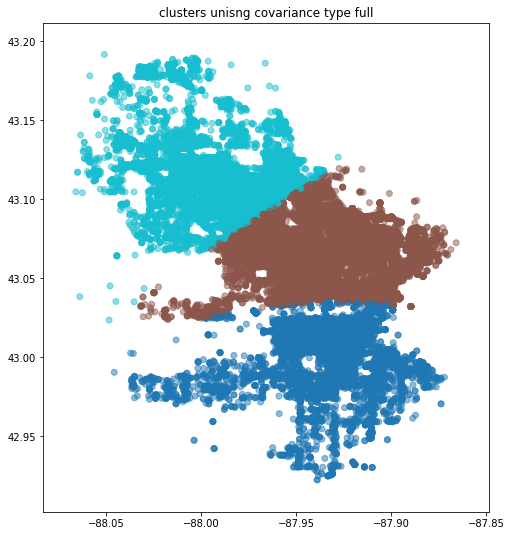

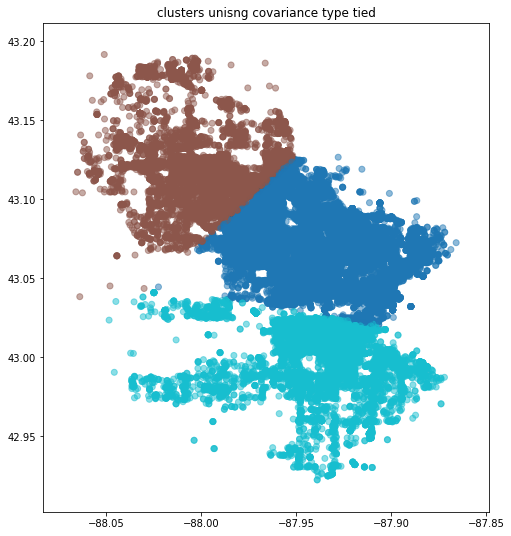

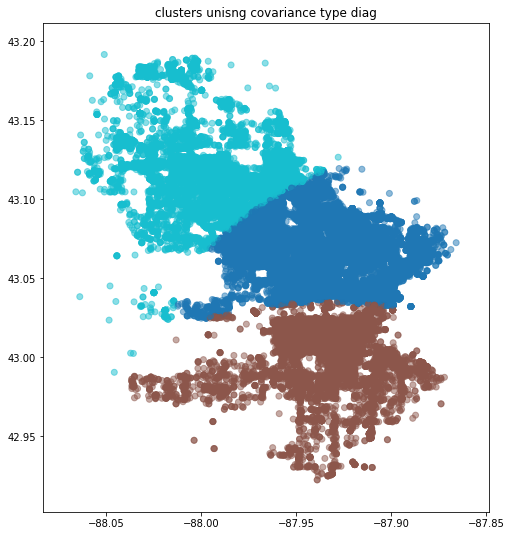

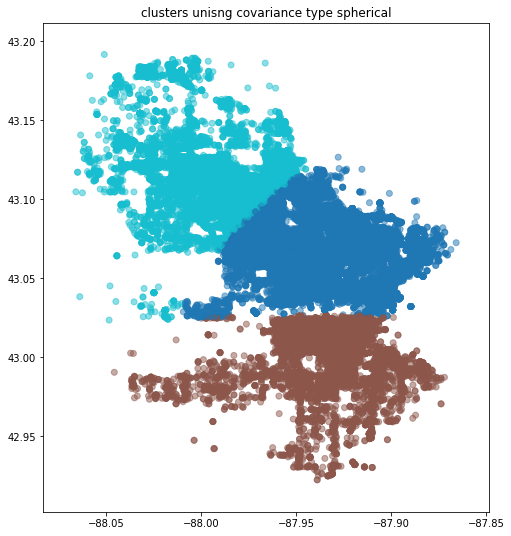

4 CLUSTERS:


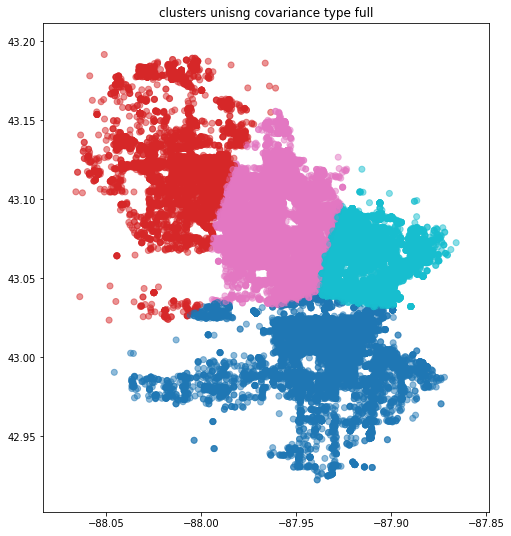

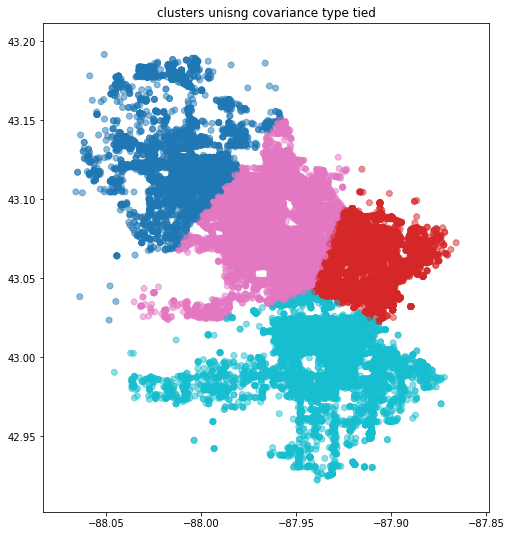

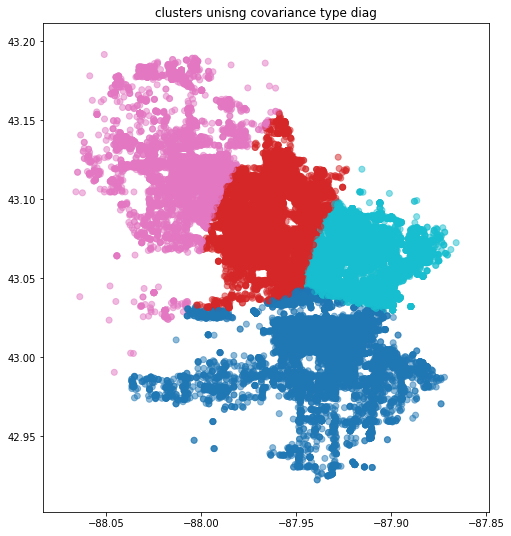

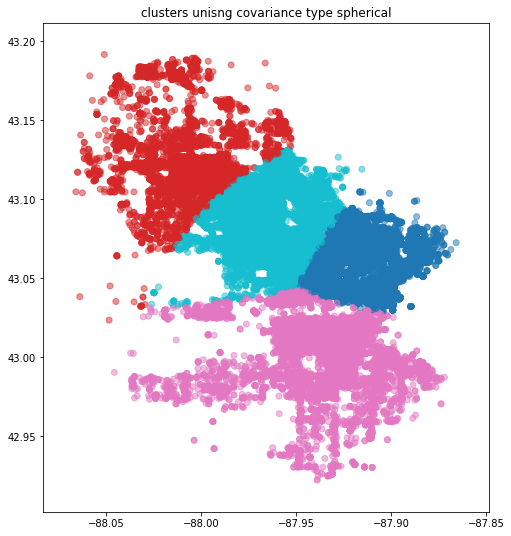

5 CLUSTERS:


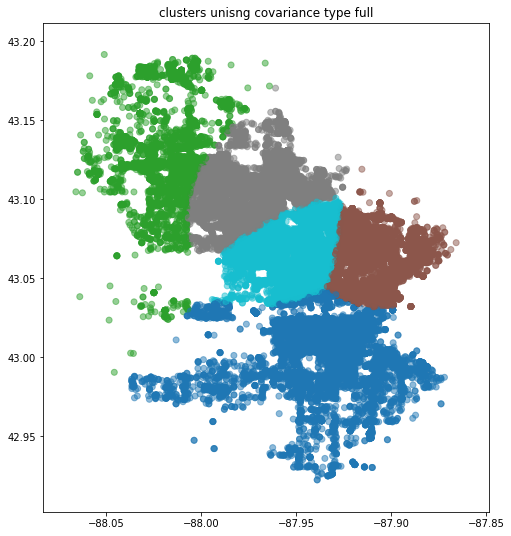

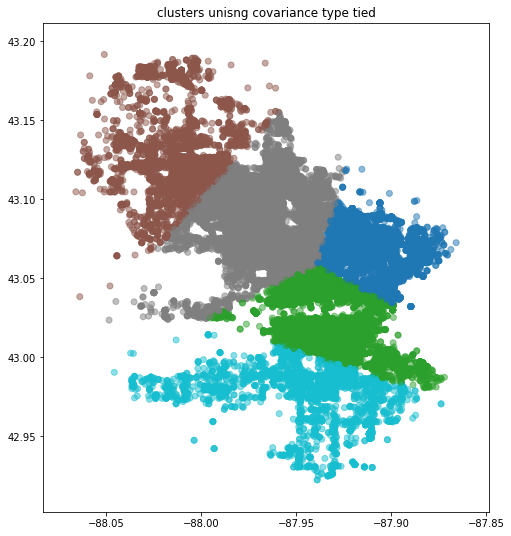

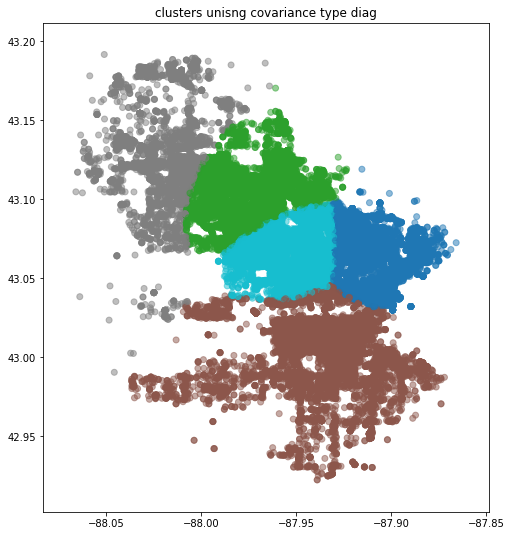

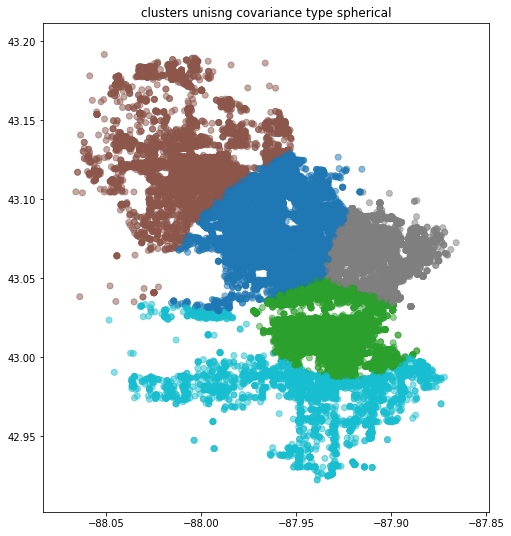

In [4]:
#makes the plot bigger
fig_size = plt.rcParams["figure.figsize"]      
fig_size[0] = 8
fig_size[1] = 9
plt.rcParams["figure.figsize"] = fig_size

#plot all the data points in the csv excluding error points using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']

for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df1[['x_lng', 'y_lat']])
        cAssign=gm.predict(df1[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df1['x_lng'],df1['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

### Covarience
'full' (each component has its own general covariance matrix),<br />'tied' (all components share the same general covariance matrix) <br />'diag' (each component has its own diagonal covariance matrix)
 <br />'spherical' (each component has its own single variance)

Covariance is a measure of the directional relationship between the returns on two risky assets. 
Variance is a measurement of the spread between numbers in a data set. 





## GaussianMixture by guilty and not guilty 

In [5]:
#guilty vs not guilty dataframe
dfg=df1[df1.guilty==1]
dfng= df1[df1.guilty==0]

3 CLUSTERS:


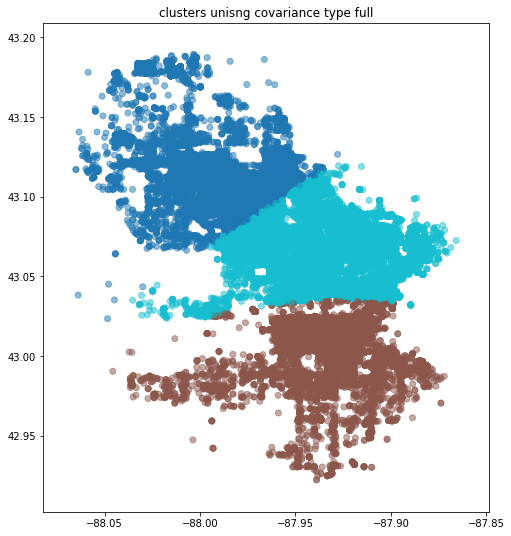

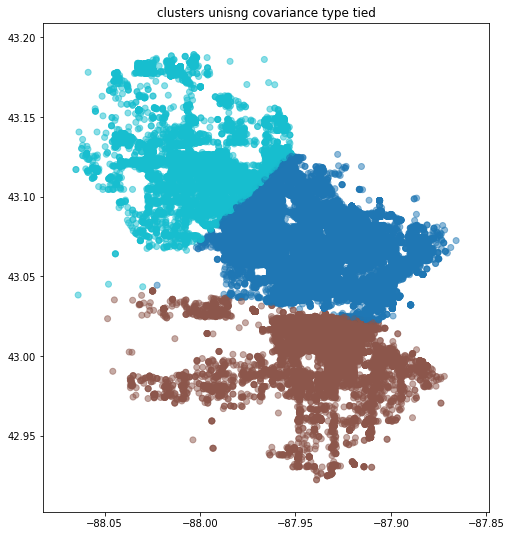

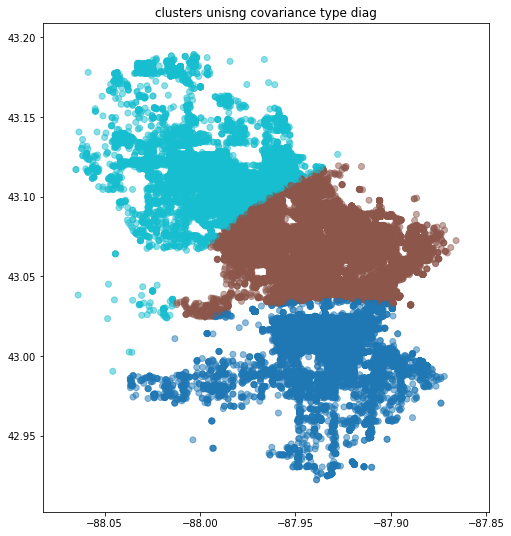

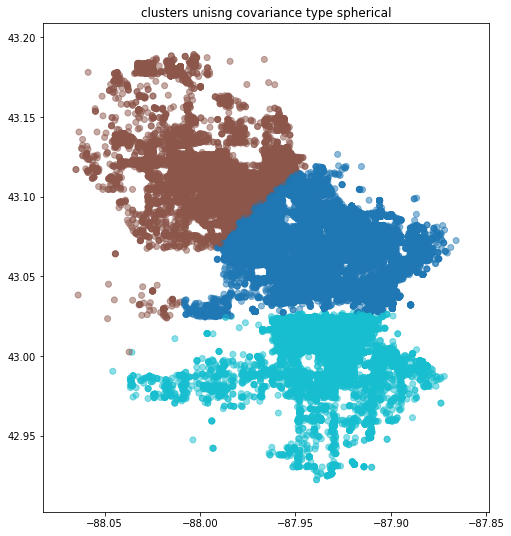

4 CLUSTERS:


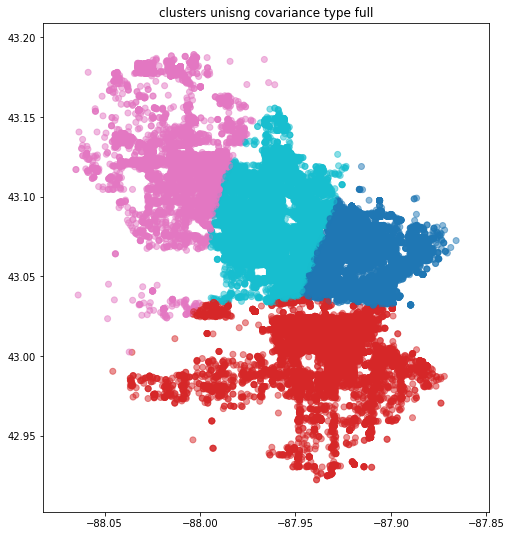

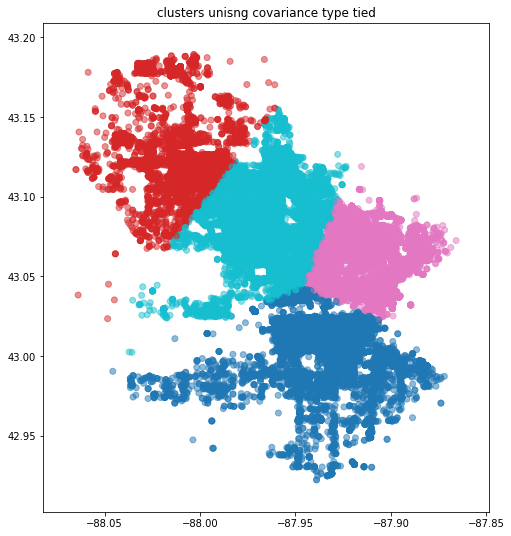

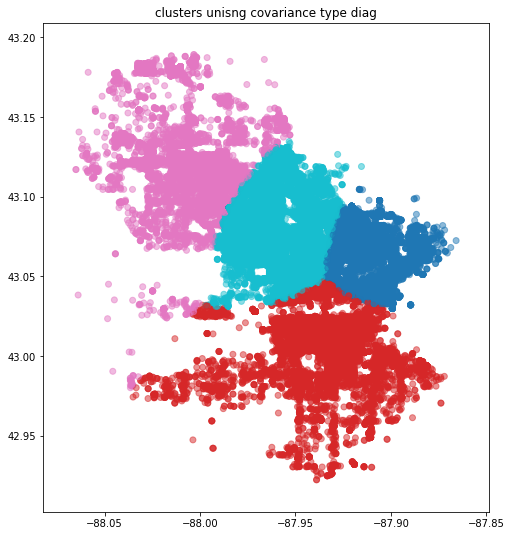

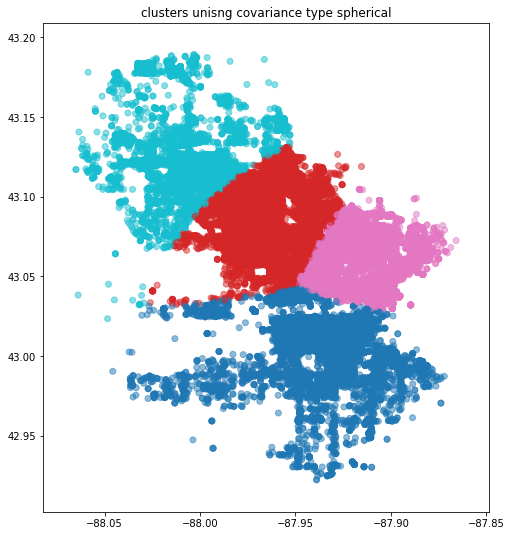

5 CLUSTERS:


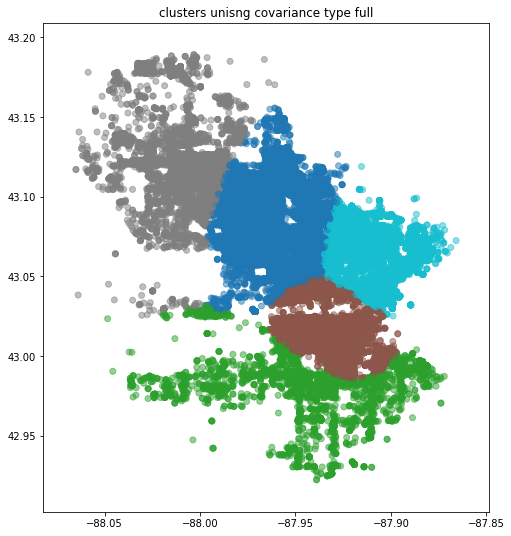

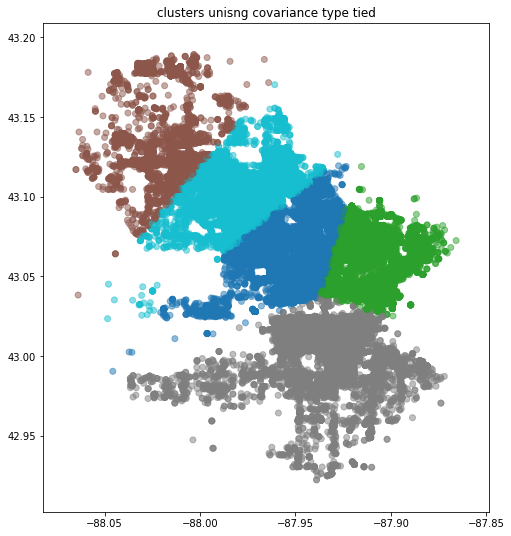

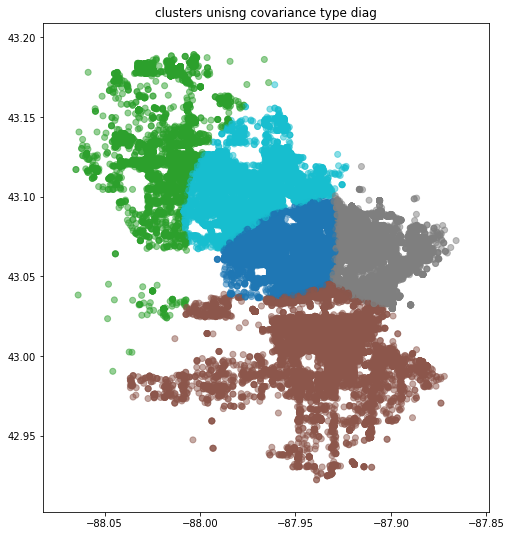

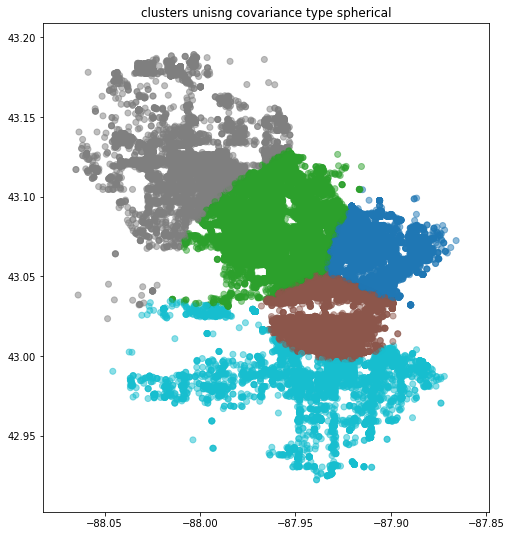

In [6]:
#plot all the data points in the csv excluding errors that are guilty using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(dfg[['x_lng', 'y_lat']])
        cAssign=gm.predict(dfg[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(dfg['x_lng'],dfg['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

3 CLUSTERS:


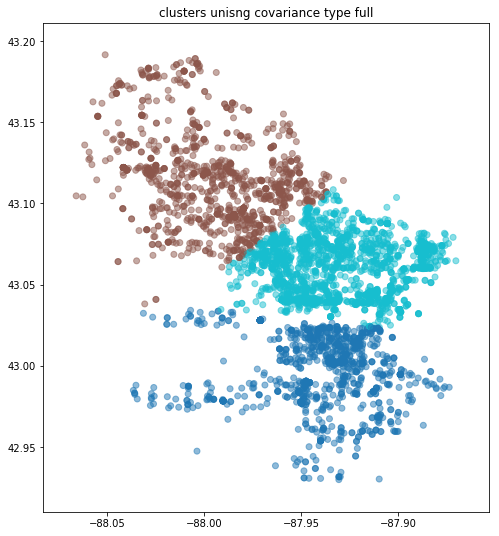

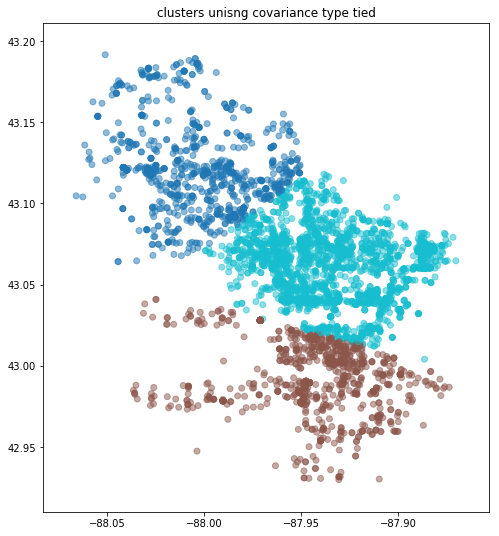

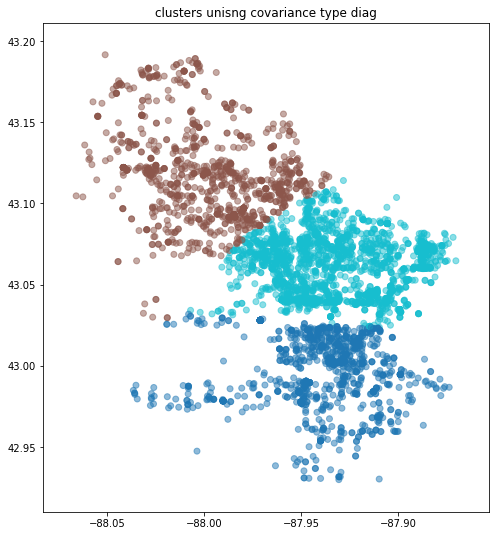

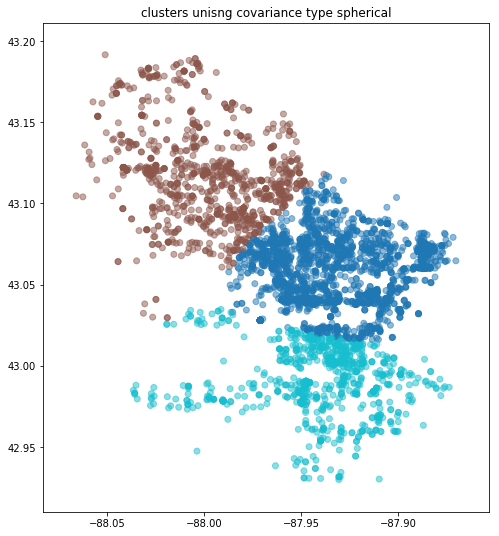

4 CLUSTERS:


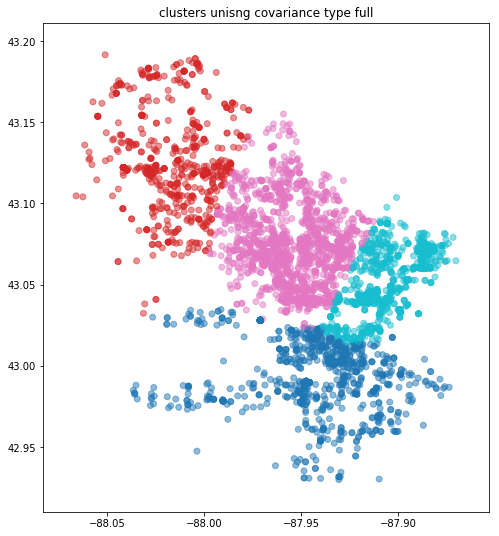

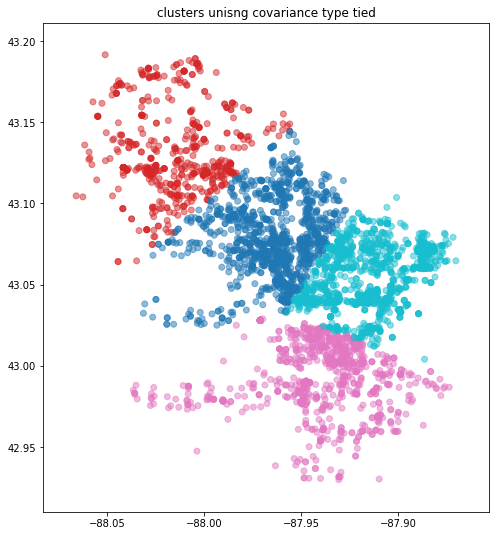

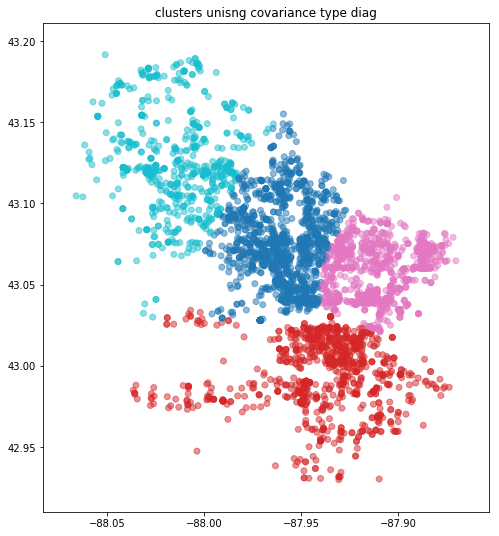

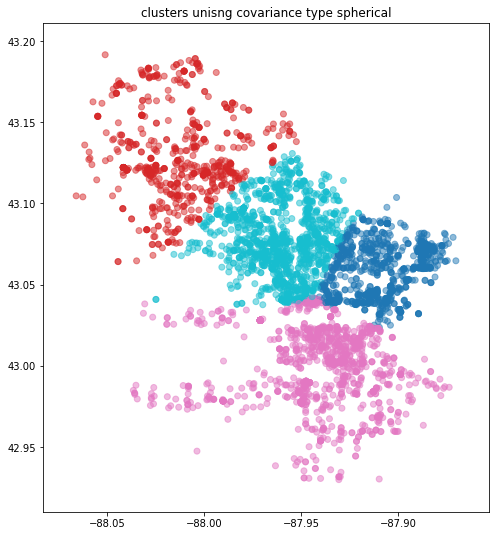

5 CLUSTERS:


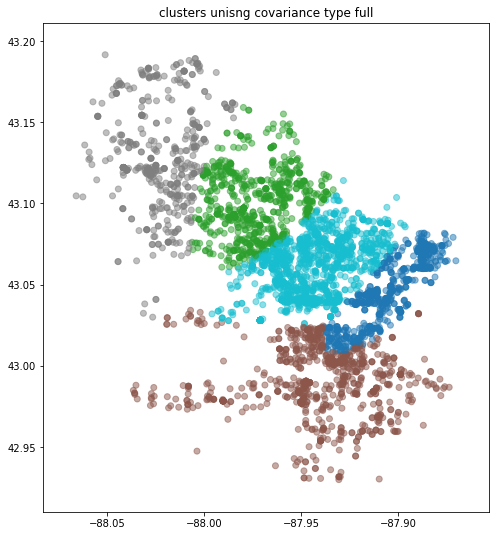

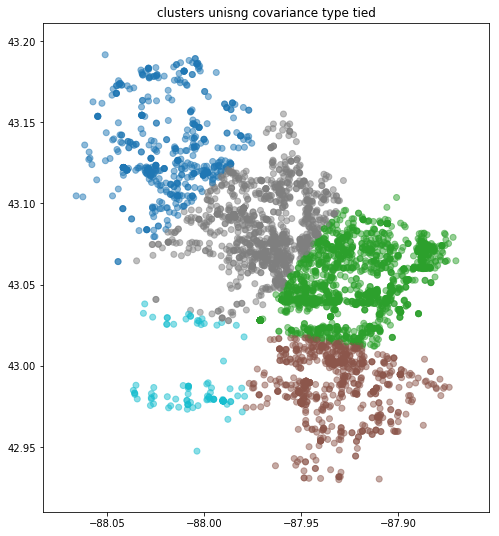

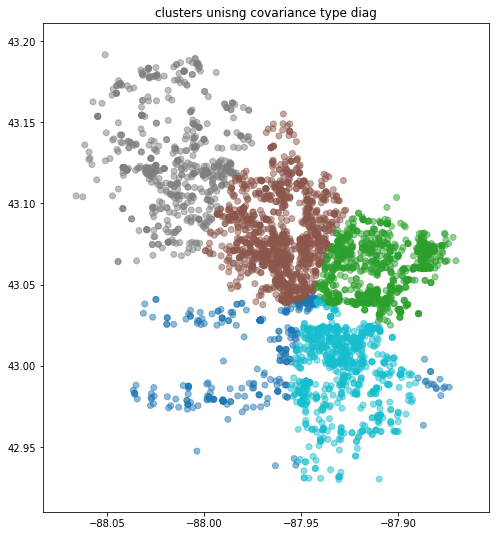

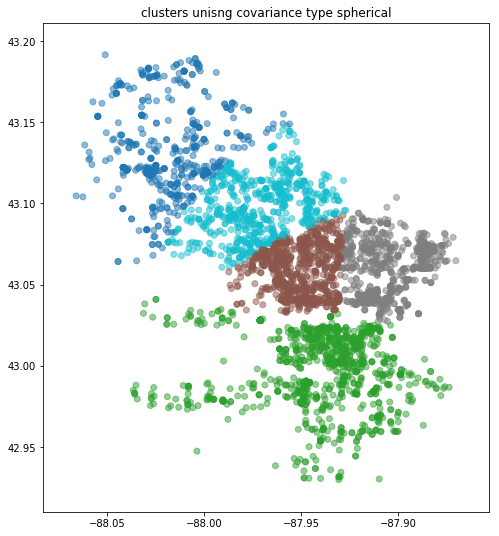

In [7]:
#plot all the data points in the csv excluding errors that are not guilty using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(dfng[['x_lng', 'y_lat']])
        cAssign=gm.predict(dfng[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(dfng['x_lng'],dfng['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

## GaussianMixture by Year and Month

In [7]:
#make different dataframe that has the data per year
df09 = df1[df1.year == 2009]
df09.head()
df10 = df1[df1.year == 2010]
df10.head()
df11 = df1[df1.year == 2011]
df11.head()
df12 = df1[df1.year == 2012]
df12.head()
df13 = df1[df1.year == 2013]
df13.head()
df14 = df1[df1.year == 2014]

3 CLUSTERS:


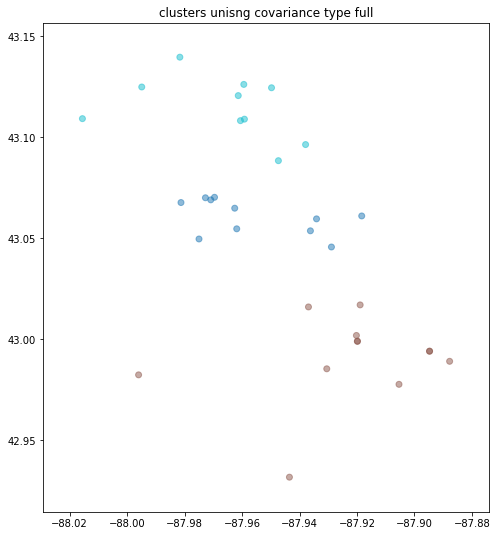

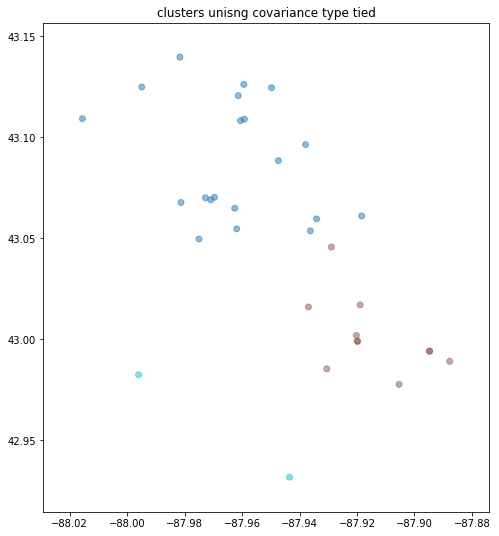

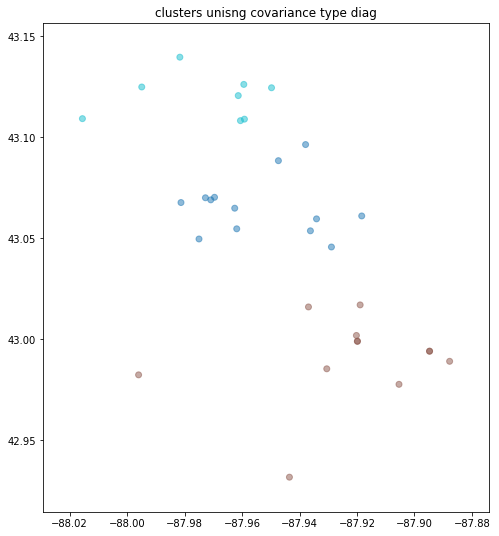

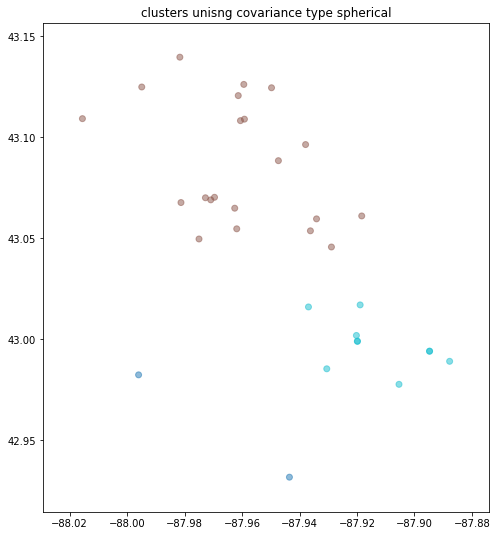

4 CLUSTERS:


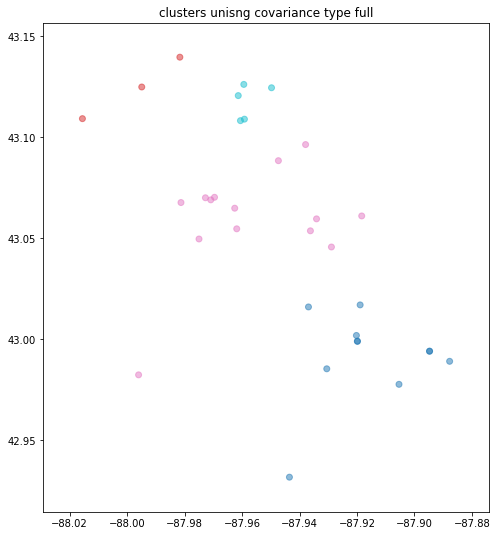

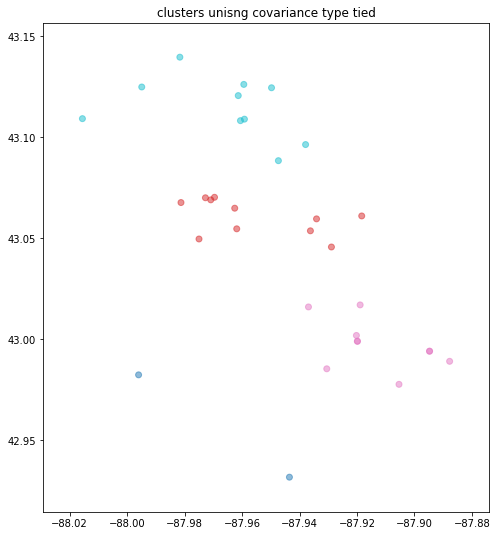

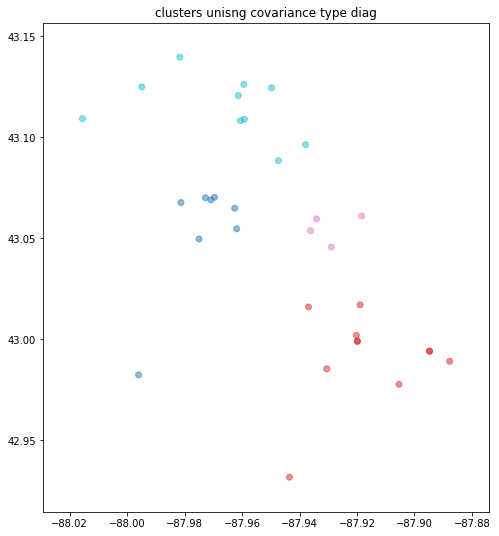

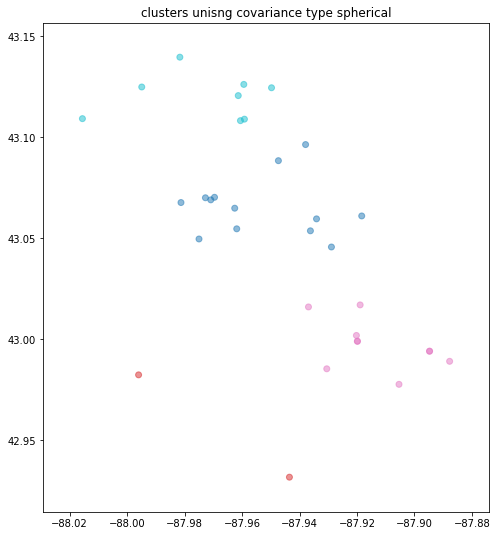

5 CLUSTERS:


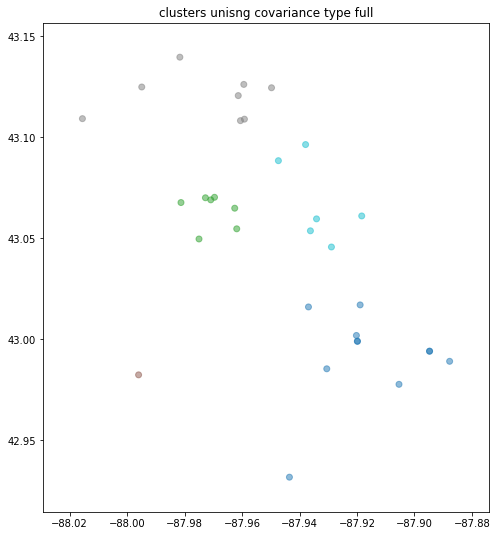

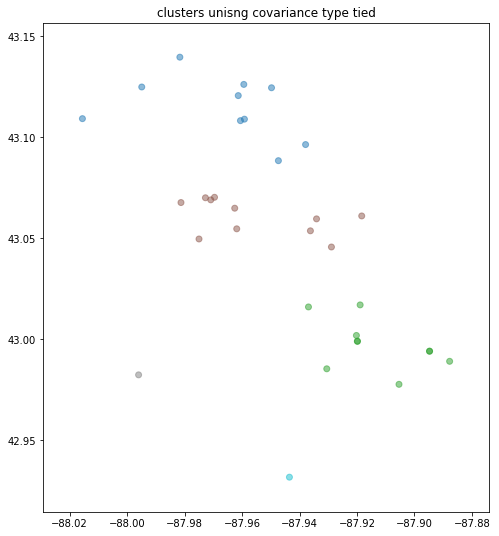

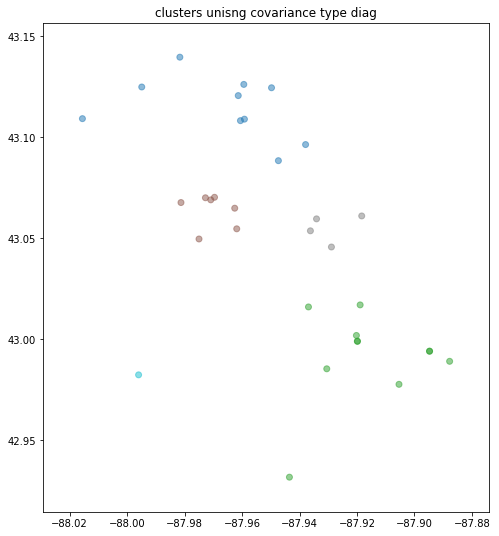

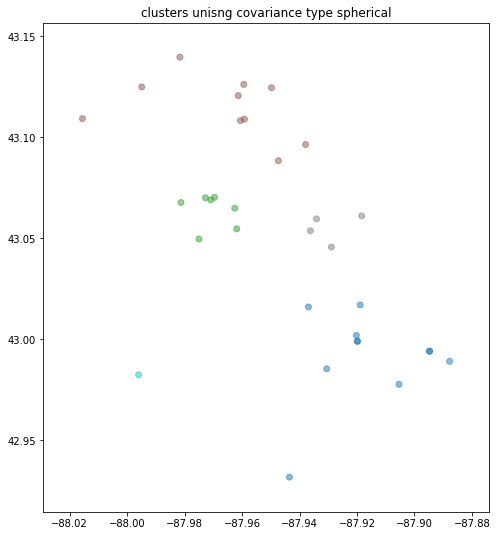

In [16]:
#makes the plot smaller
fig_size = plt.rcParams["figure.figsize"]      
fig_size[0] = 8
fig_size[1] = 9
plt.rcParams["figure.figsize"] = fig_size


#plot all the data points in the csv excluding errors in year 2009 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df09[['x_lng', 'y_lat']])
        cAssign=gm.predict(df09[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df09['x_lng'],df09['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

3 CLUSTERS:


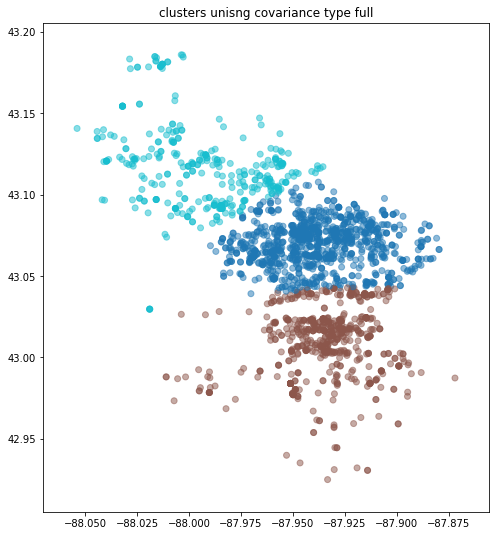

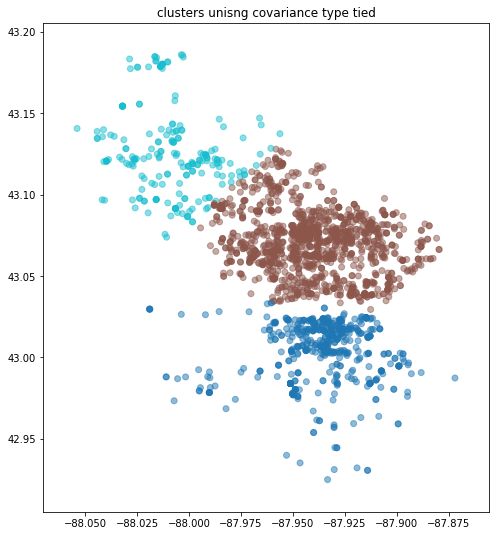

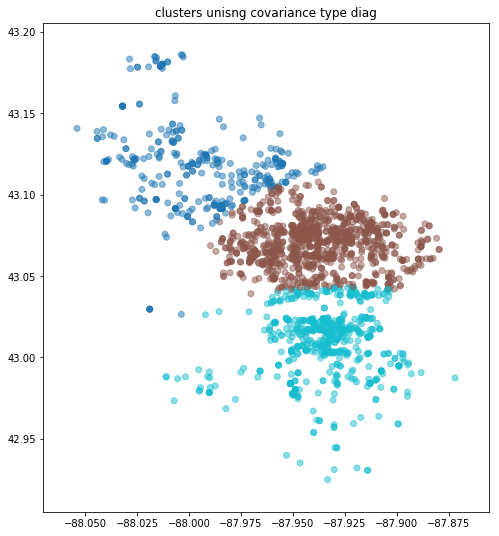

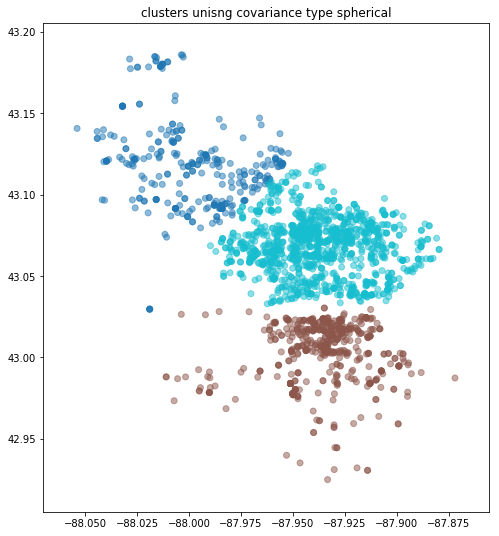

4 CLUSTERS:


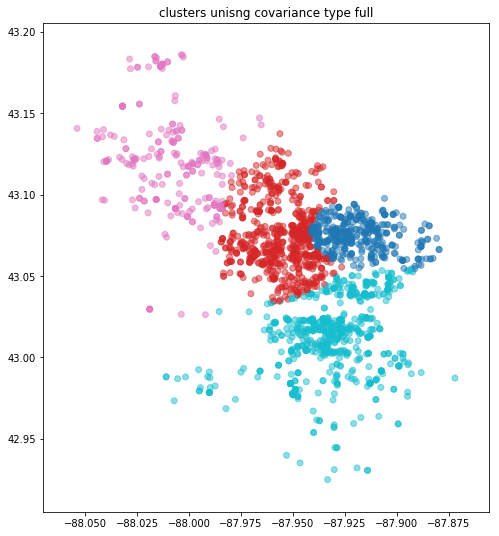

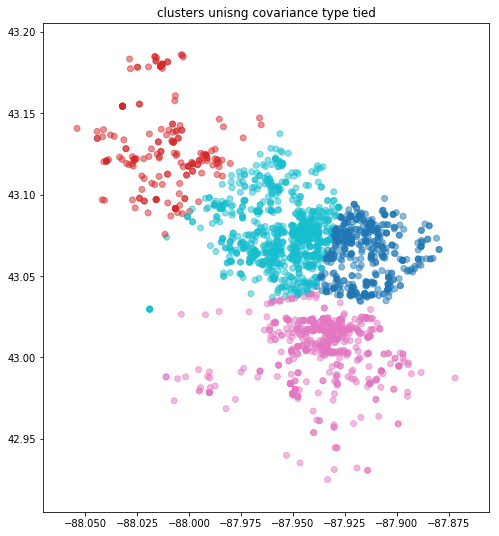

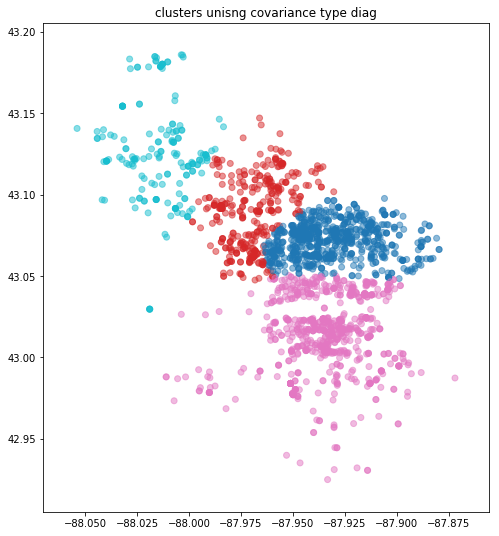

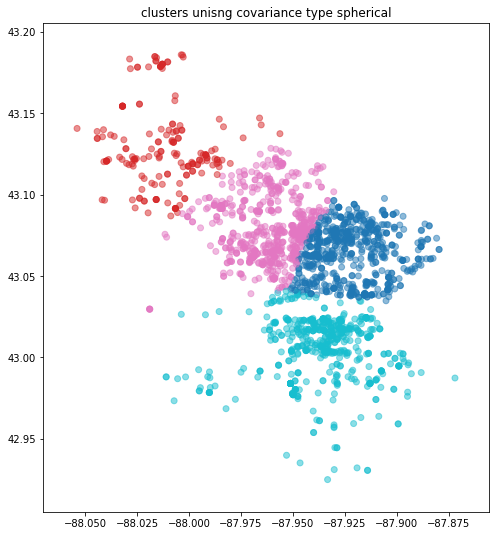

5 CLUSTERS:


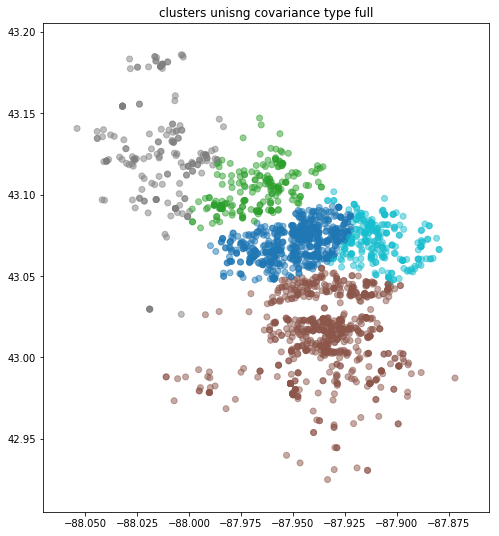

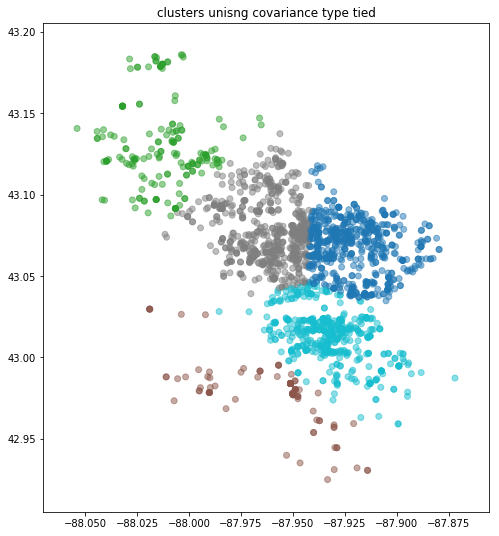

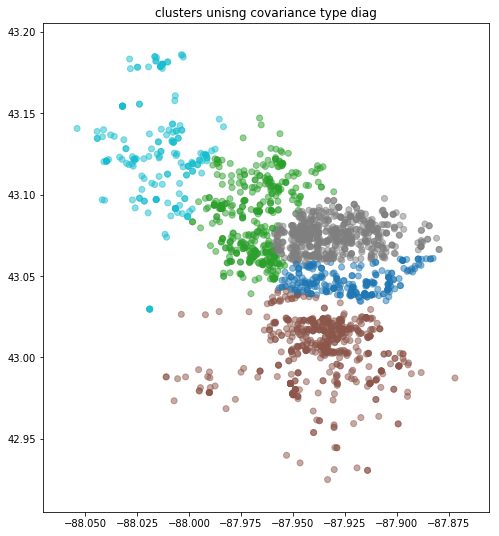

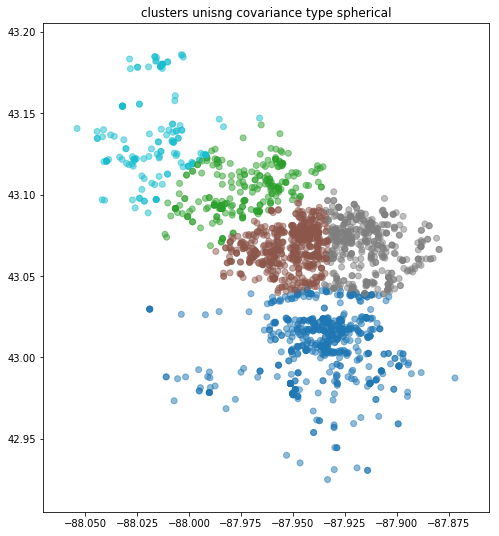

In [17]:
#plot all the data points in the csv  excluding errors in year 2010 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df10[['x_lng', 'y_lat']])
        cAssign=gm.predict(df10[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df10['x_lng'],df10['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

3 CLUSTERS:


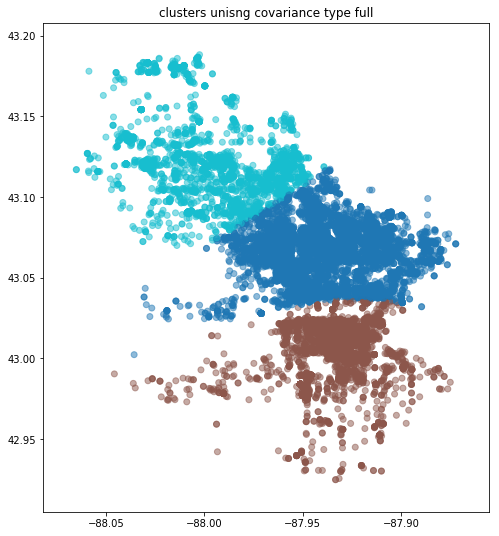

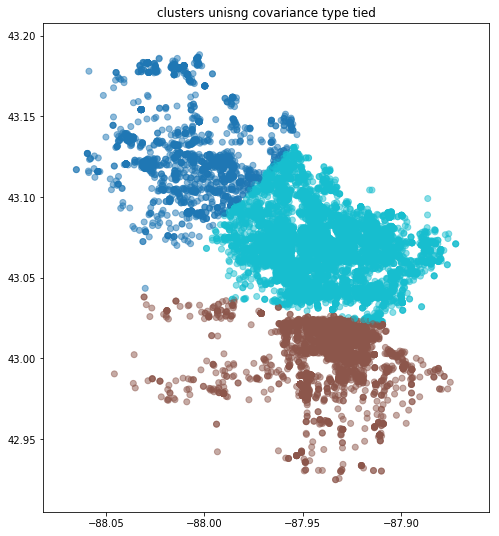

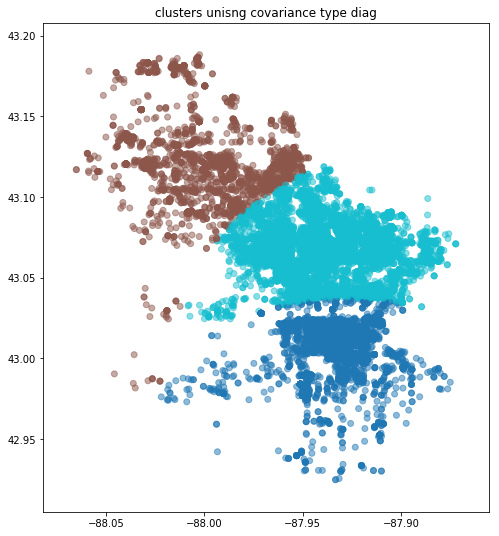

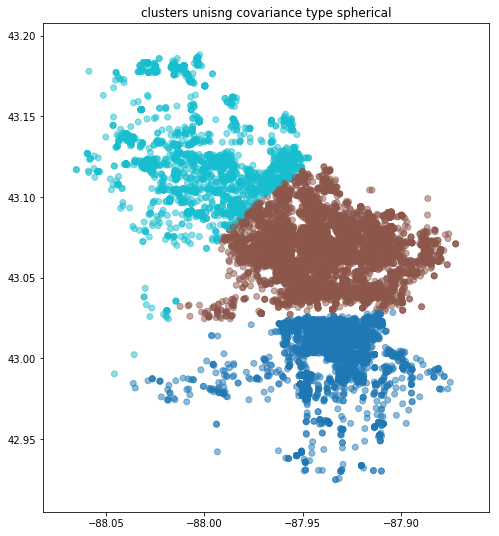

4 CLUSTERS:


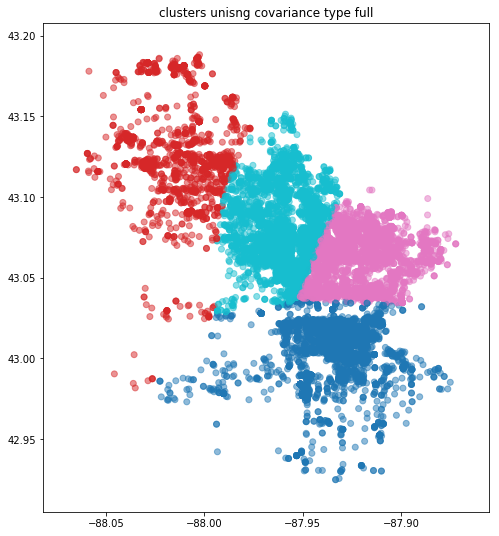

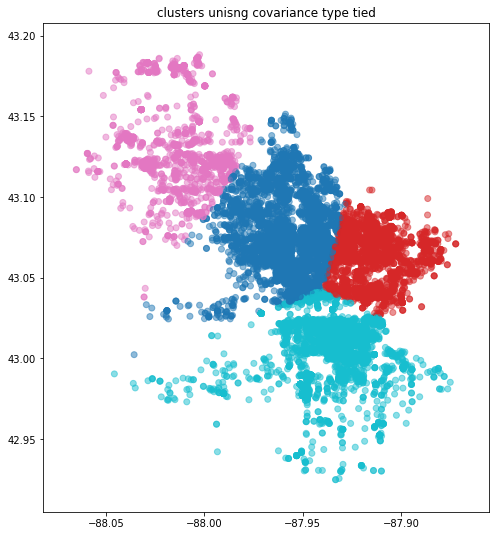

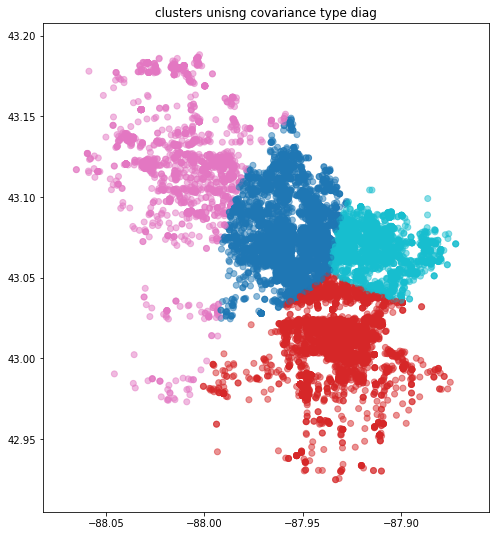

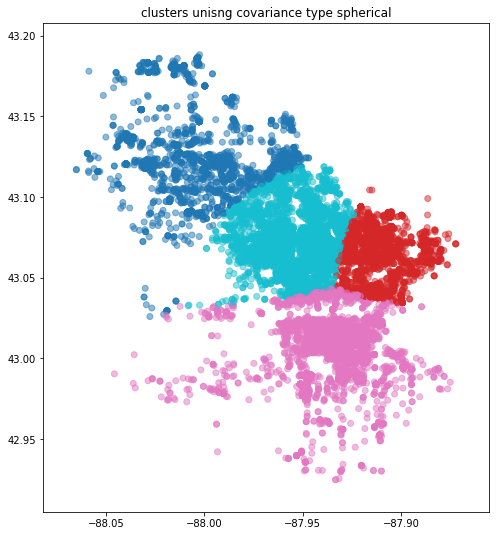

5 CLUSTERS:


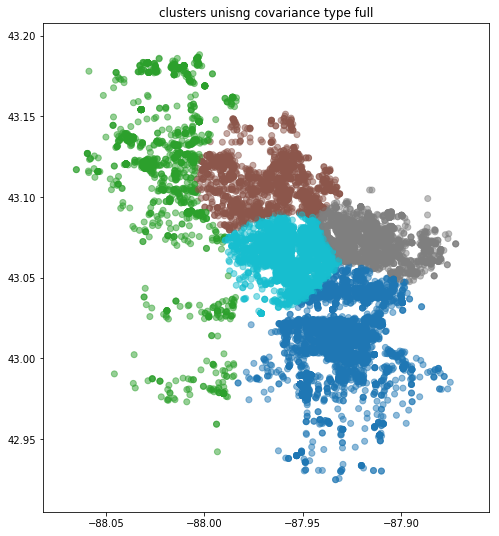

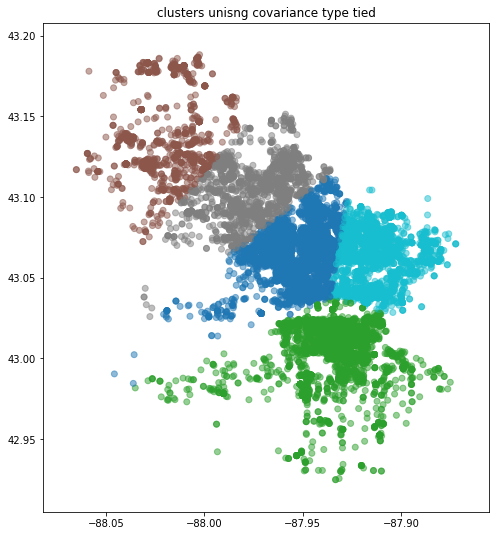

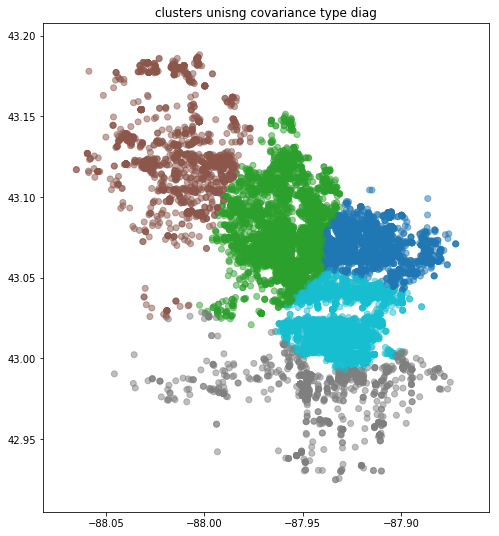

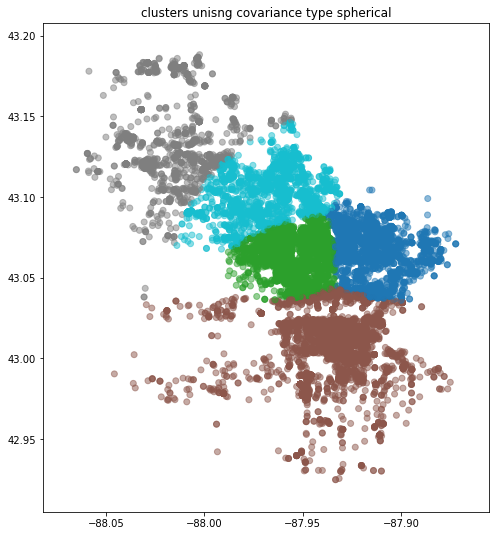

In [18]:
#plot all the data points in the csv excluding errors in year 2011 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df11[['x_lng', 'y_lat']])
        cAssign=gm.predict(df11[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df11['x_lng'],df11['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [32]:
#dataframe by month in 2011
df111 = df11[df11.month == 1]
df112 = df11[df11.month == 2]
df113 = df11[df11.month == 3]
df114 = df11[df11.month == 4]
df115 = df11[df11.month == 5]
df116 = df11[df11.month == 6]
df117 = df11[df11.month == 7]
df118 = df11[df11.month == 8]
df119 = df11[df11.month == 9]
df1110 = df11[df11.month == 10]
df1111 = df11[df11.month == 11]
df1112 = df11[df11.month == 12]

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 1 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df111[['x_lng', 'y_lat']])
        cAssign=gm.predict(df111[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df111['x_lng'],df111['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 2 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df112[['x_lng', 'y_lat']])
        cAssign=gm.predict(df112[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df112['x_lng'],df112['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 3 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df113[['x_lng', 'y_lat']])
        cAssign=gm.predict(df113[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df113['x_lng'],df113['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 4 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df114[['x_lng', 'y_lat']])
        cAssign=gm.predict(df114[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df114['x_lng'],df114['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 5 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df115[['x_lng', 'y_lat']])
        cAssign=gm.predict(df115[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df115['x_lng'],df115['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, moth 6 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df116[['x_lng', 'y_lat']])
        cAssign=gm.predict(df116[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df116['x_lng'],df116['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 7 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df117[['x_lng', 'y_lat']])
        cAssign=gm.predict(df117[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df117['x_lng'],df117['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 8 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df118[['x_lng', 'y_lat']])
        cAssign=gm.predict(df118[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df118['x_lng'],df118['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 9 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df119[['x_lng', 'y_lat']])
        cAssign=gm.predict(df119[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df119['x_lng'],df119['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 10 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df1110[['x_lng', 'y_lat']])
        cAssign=gm.predict(df1110[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df1110['x_lng'],df1110['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 11 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df1111[['x_lng', 'y_lat']])
        cAssign=gm.predict(df1111[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df1111['x_lng'],df1111['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2011, month 12 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df1112[['x_lng', 'y_lat']])
        cAssign=gm.predict(df1112[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df1112['x_lng'],df1112['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

3 CLUSTERS:


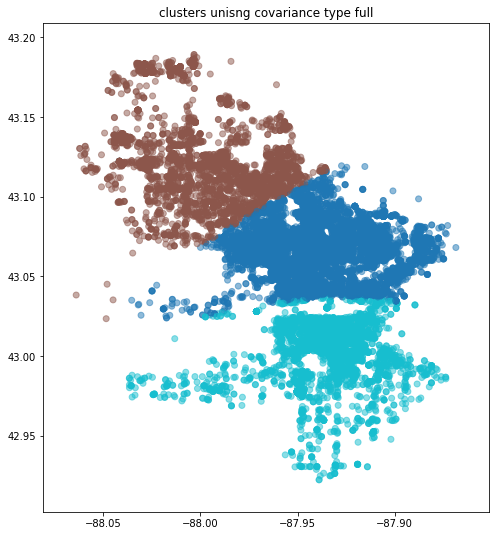

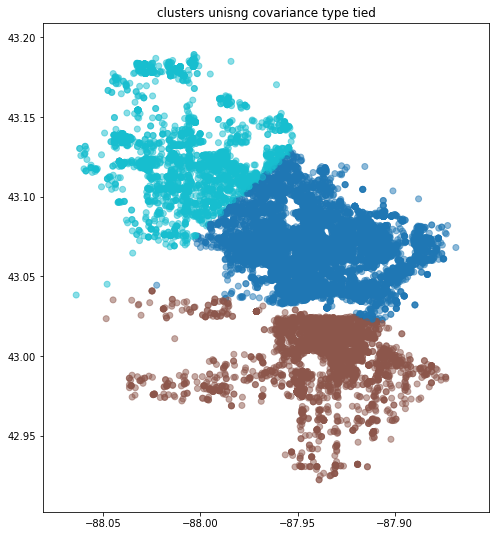

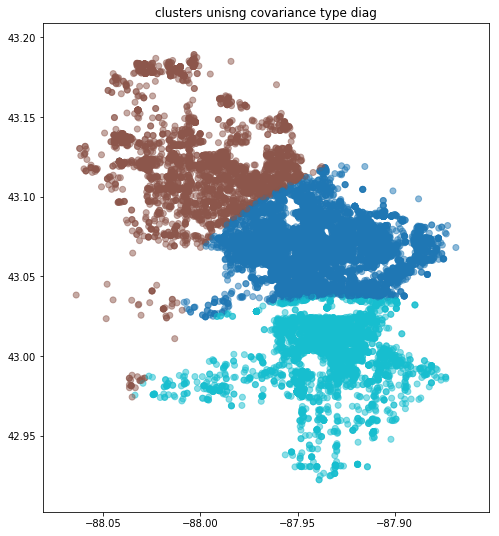

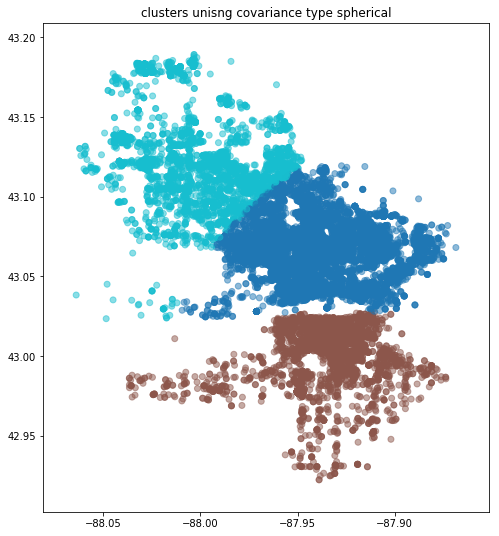

4 CLUSTERS:


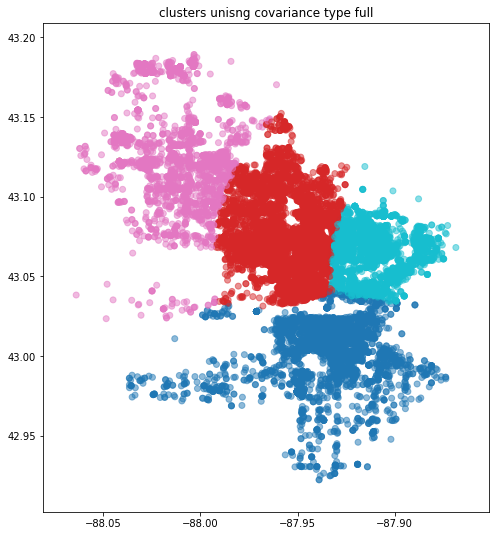

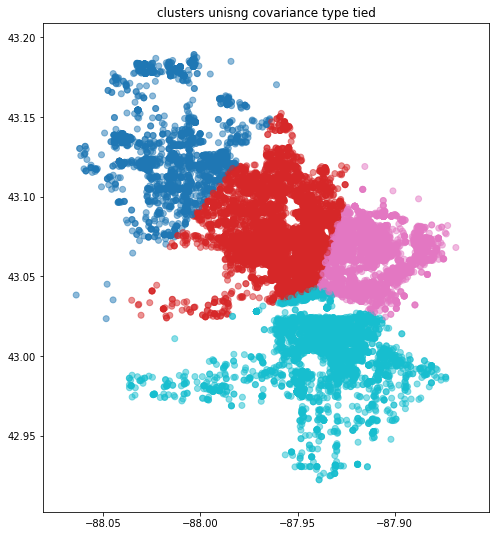

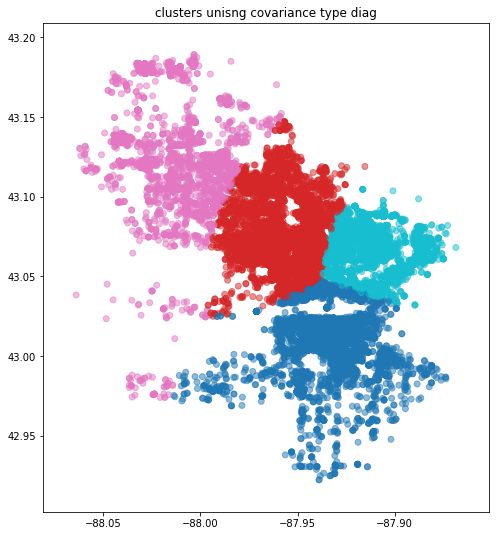

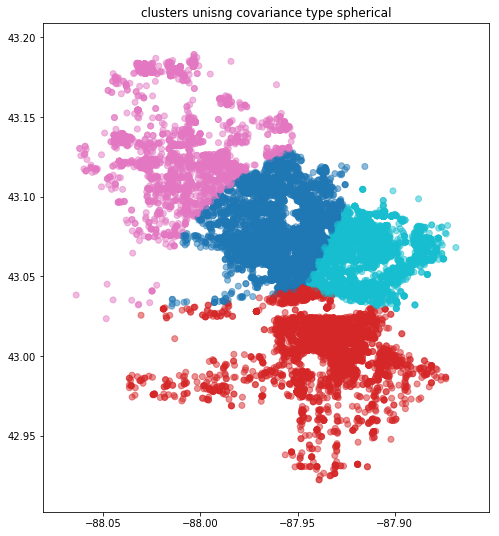

5 CLUSTERS:


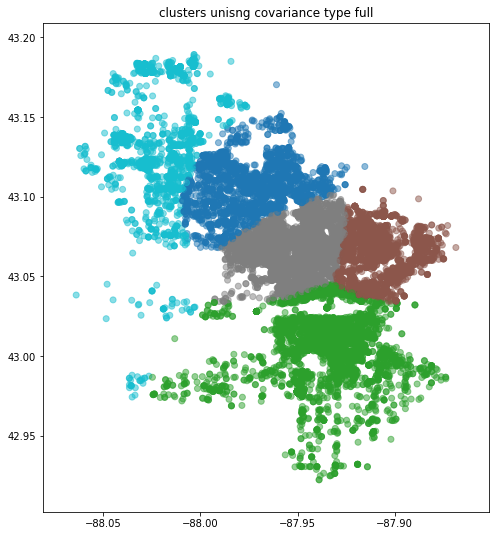

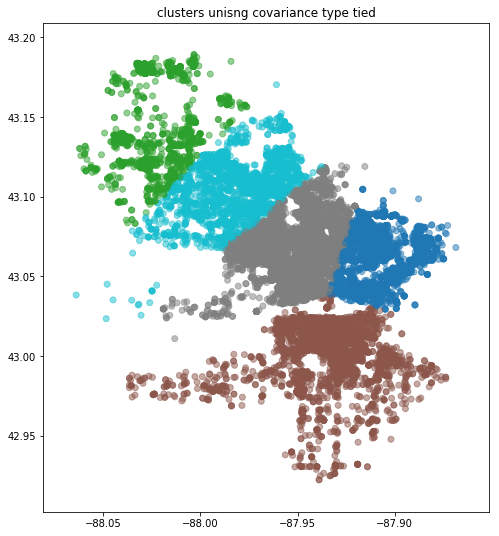

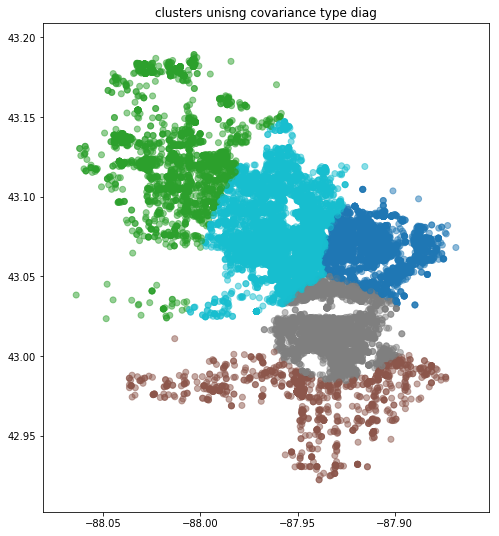

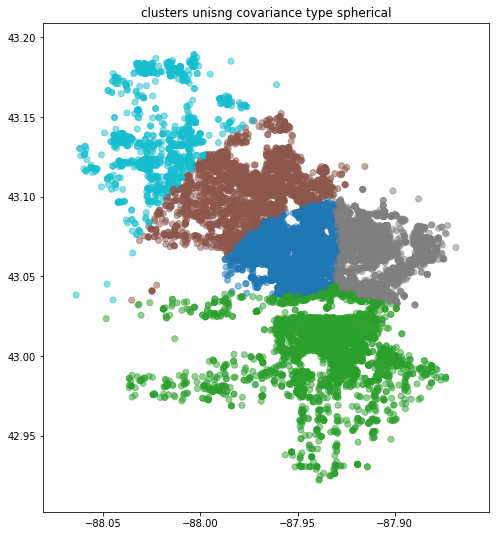

In [19]:
#plot all the data points in the csv excluding errors in year 2012 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df12[['x_lng', 'y_lat']])
        cAssign=gm.predict(df12[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df12['x_lng'],df12['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [34]:
#dataframe by month in 2012
df121 = df12[df12.month == 1]
df122 = df12[df12.month == 2]
df123 = df12[df12.month == 3]
df124 = df12[df12.month == 4]
df125 = df12[df12.month == 5]
df126 = df12[df12.month == 6]
df127 = df12[df12.month == 7]
df128 = df12[df12.month == 8]
df129 = df12[df12.month == 9]
df1210 = df12[df12.month == 10]
df1211 = df12[df12.month == 11]
df1212 = df12[df12.month == 12]

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 1 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df121[['x_lng', 'y_lat']])
        cAssign=gm.predict(df121[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df121['x_lng'],df121['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 2 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df122[['x_lng', 'y_lat']])
        cAssign=gm.predict(df122[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df122['x_lng'],df122['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 3 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df123[['x_lng', 'y_lat']])
        cAssign=gm.predict(df123[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df123['x_lng'],df123['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 4 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df124[['x_lng', 'y_lat']])
        cAssign=gm.predict(df124[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df124['x_lng'],df124['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 5 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df125[['x_lng', 'y_lat']])
        cAssign=gm.predict(df125[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df125['x_lng'],df125['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 6 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df126[['x_lng', 'y_lat']])
        cAssign=gm.predict(df126[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df126['x_lng'],df126['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 7 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df127[['x_lng', 'y_lat']])
        cAssign=gm.predict(df127[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df127['x_lng'],df127['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 8 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df128[['x_lng', 'y_lat']])
        cAssign=gm.predict(df128[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df128['x_lng'],df128['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 9 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df129[['x_lng', 'y_lat']])
        cAssign=gm.predict(df129[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df129['x_lng'],df129['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 10 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df1210[['x_lng', 'y_lat']])
        cAssign=gm.predict(df1210[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df1210['x_lng'],df1210['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 11 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df1211[['x_lng', 'y_lat']])
        cAssign=gm.predict(df1211[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df1211['x_lng'],df1211['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2012, month 12 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df1212[['x_lng', 'y_lat']])
        cAssign=gm.predict(df1212[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df1212['x_lng'],df1212['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

3 CLUSTERS:


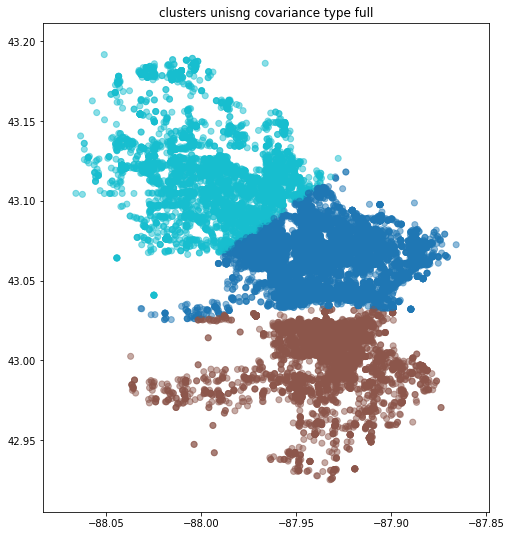

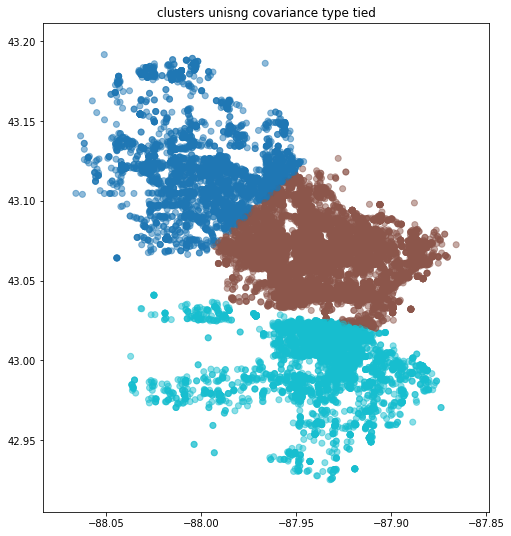

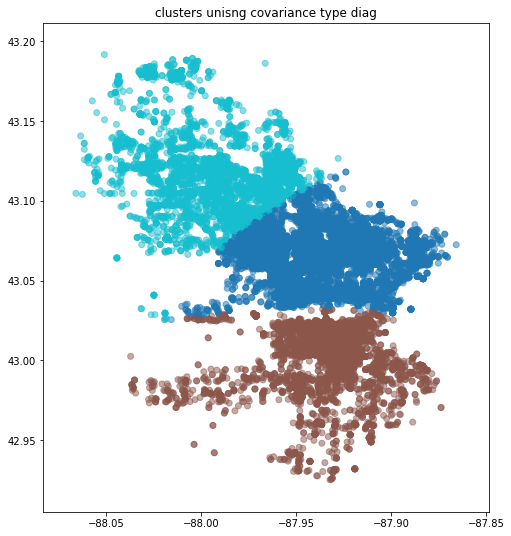

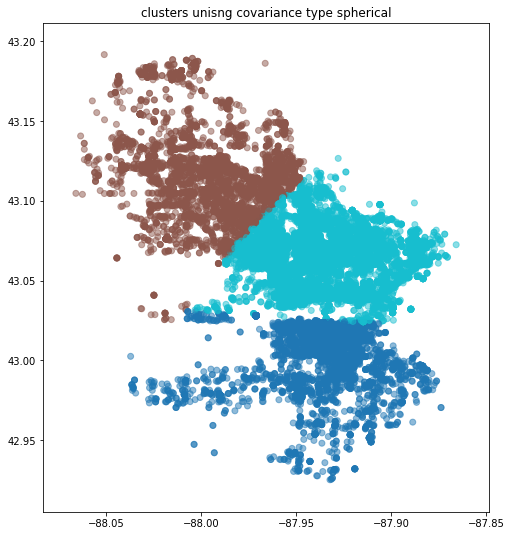

4 CLUSTERS:


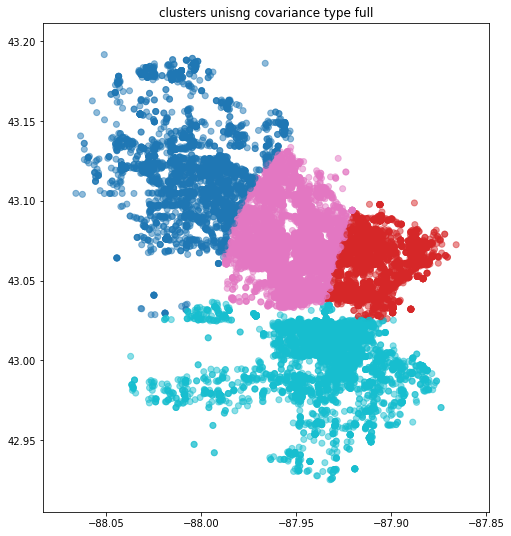

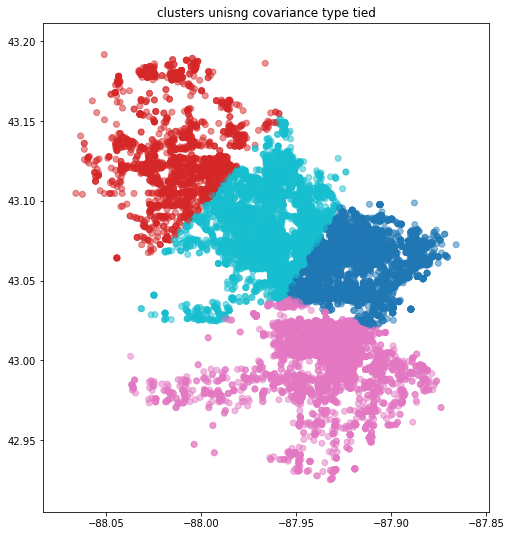

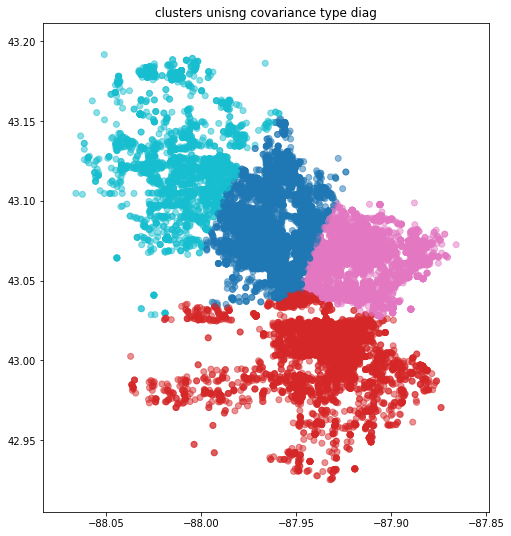

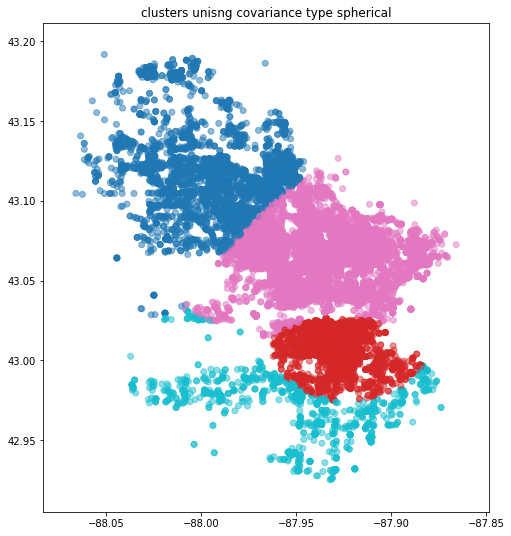

5 CLUSTERS:


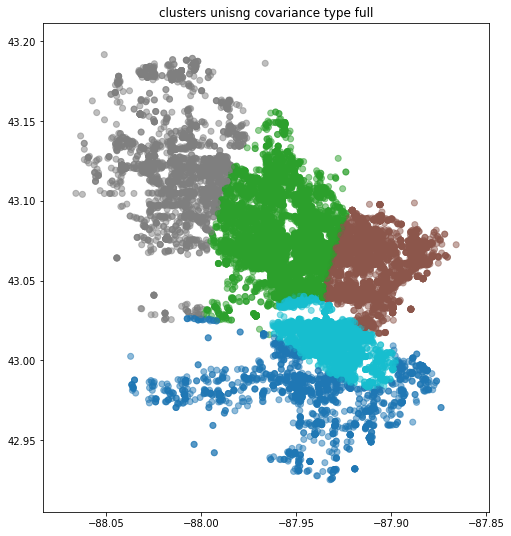

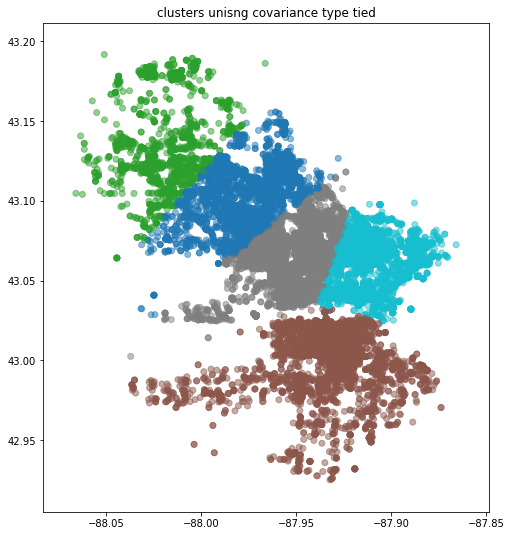

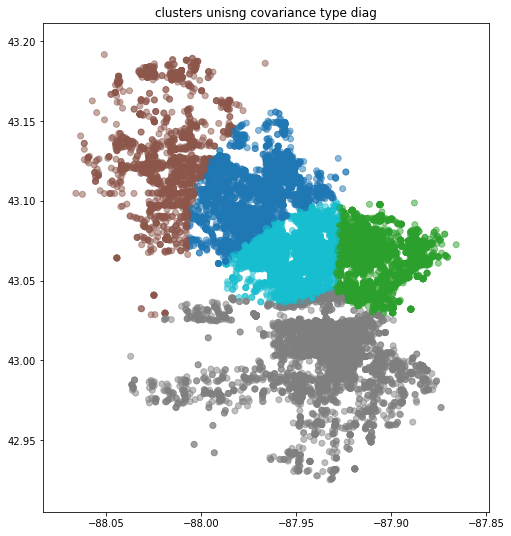

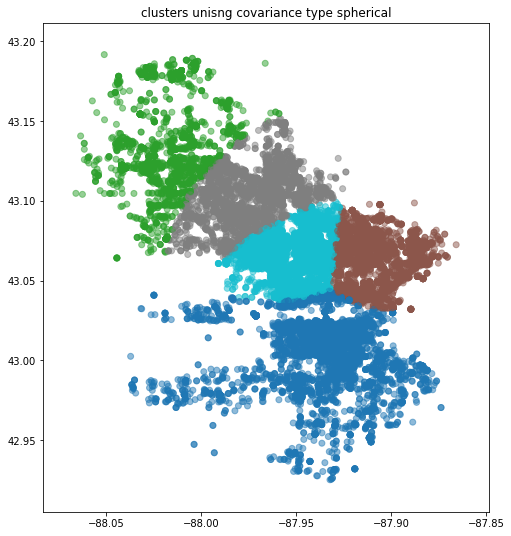

In [20]:
#plot all the data points in the csv excluding errors in year 2013 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df13[['x_lng', 'y_lat']])
        cAssign=gm.predict(df13[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df13['x_lng'],df13['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [35]:
#dataframe by month in 2013
df131 = df13[df13.month == 1]
df132 = df13[df13.month == 2]
df133 = df13[df13.month == 3]
df134 = df13[df13.month == 4]
df135 = df13[df13.month == 5]
df136 = df13[df13.month == 6]
df137 = df13[df13.month == 7]
df138 = df13[df13.month == 8]
df139 = df13[df13.month == 9]
df1310 = df13[df13.month == 10]
df1311 = df13[df13.month == 11]
df1312 = df13[df13.month == 12]

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 1 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df131[['x_lng', 'y_lat']])
        cAssign=gm.predict(df131[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df131['x_lng'],df131['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 2 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df132[['x_lng', 'y_lat']])
        cAssign=gm.predict(df132[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df132['x_lng'],df132['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 3 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df133[['x_lng', 'y_lat']])
        cAssign=gm.predict(df133[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df133['x_lng'],df133['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 4 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df134[['x_lng', 'y_lat']])
        cAssign=gm.predict(df134[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df134['x_lng'],df134['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 5 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df135[['x_lng', 'y_lat']])
        cAssign=gm.predict(df135[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df135['x_lng'],df135['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 6 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df136[['x_lng', 'y_lat']])
        cAssign=gm.predict(df136[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df136['x_lng'],df136['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 7 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df137[['x_lng', 'y_lat']])
        cAssign=gm.predict(df137[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df137['x_lng'],df137['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 8 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df138[['x_lng', 'y_lat']])
        cAssign=gm.predict(df138[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df138['x_lng'],df138['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 9 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df139[['x_lng', 'y_lat']])
        cAssign=gm.predict(df139[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df139['x_lng'],df139['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 10 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df1310[['x_lng', 'y_lat']])
        cAssign=gm.predict(df1310[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df1310['x_lng'],df1310['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 11 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df1311[['x_lng', 'y_lat']])
        cAssign=gm.predict(df1311[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df1311['x_lng'],df1311['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In [ ]:
#plot all the data points in the csv excluding errors in year 2013, month 12 using the GaussianMixture model
ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df1312[['x_lng', 'y_lat']])
        cAssign=gm.predict(df1312[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df1312['x_lng'],df1312['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

3 CLUSTERS:


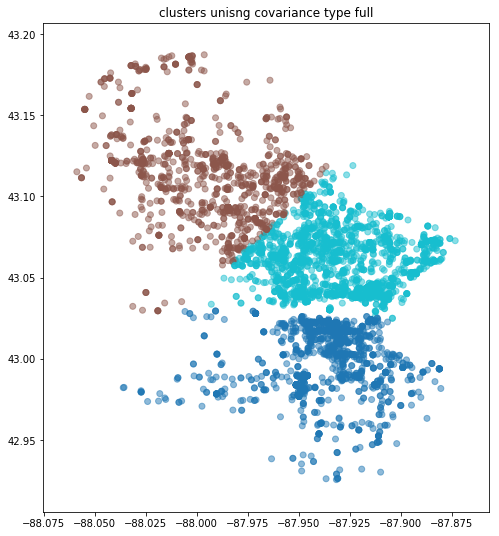

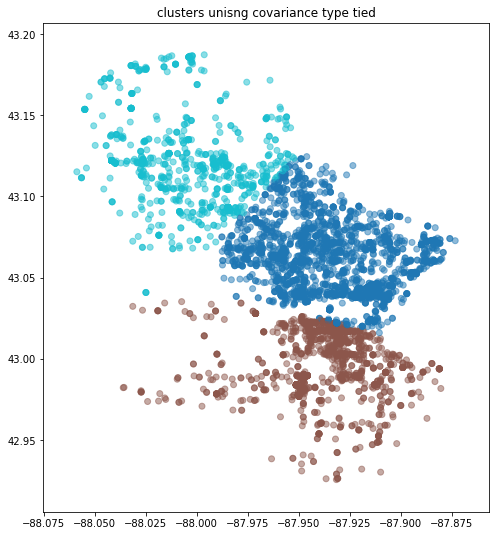

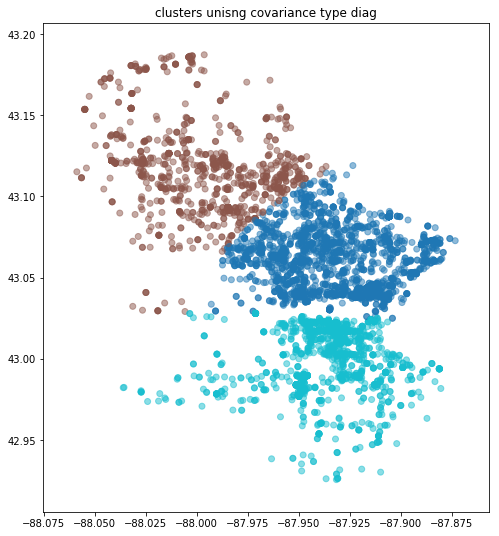

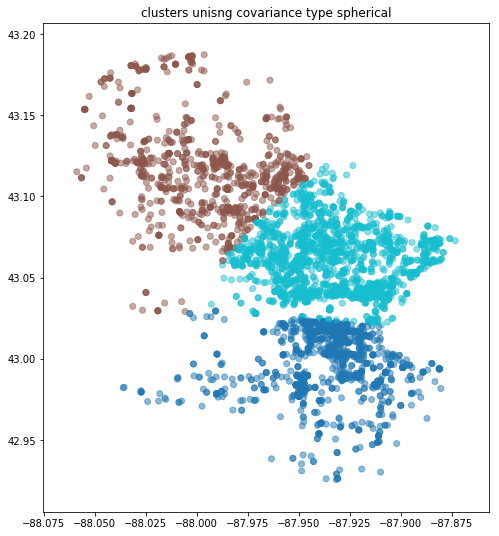

4 CLUSTERS:


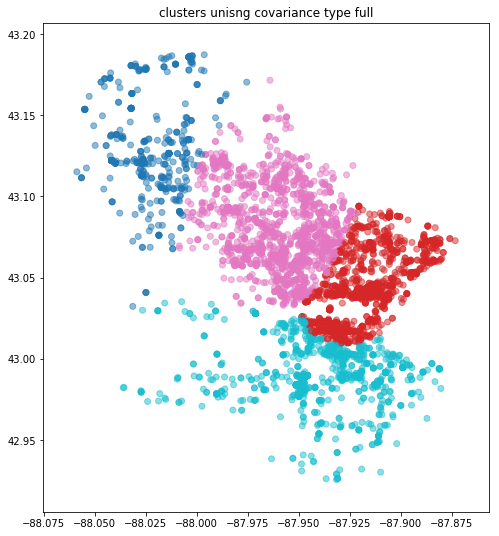

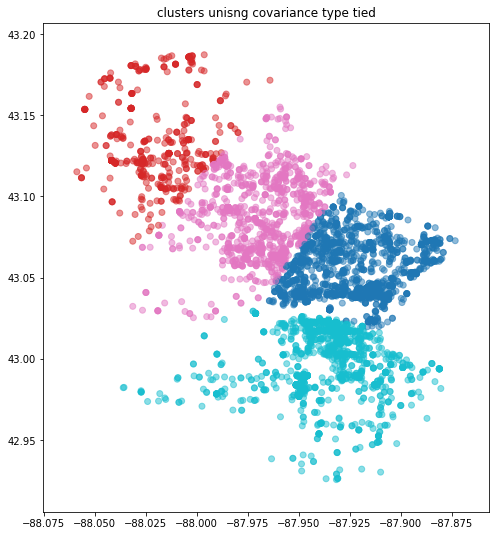

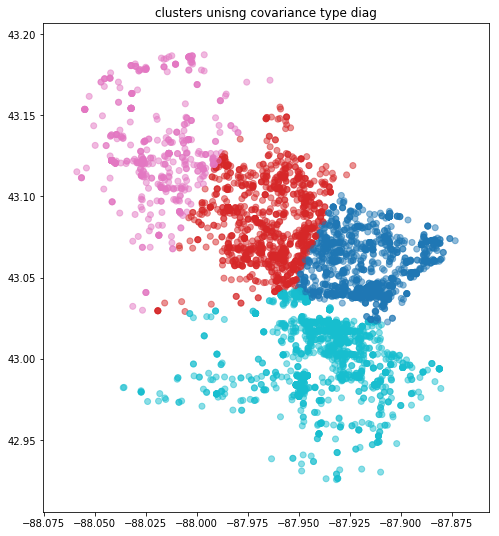

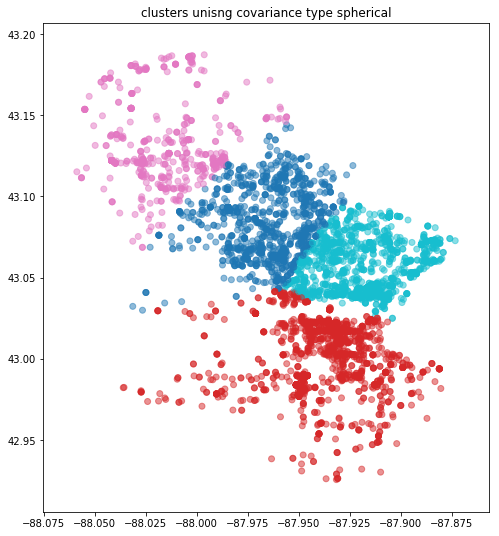

5 CLUSTERS:


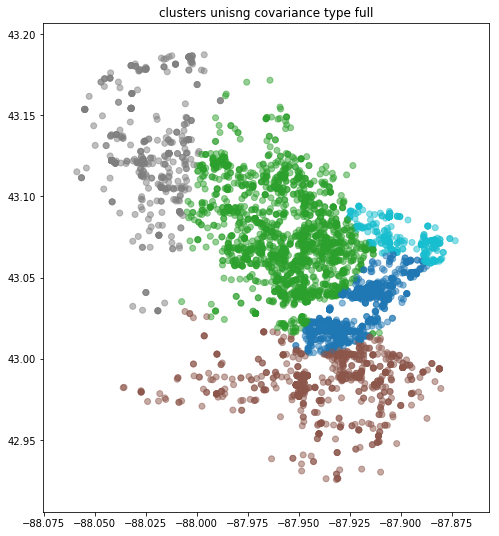

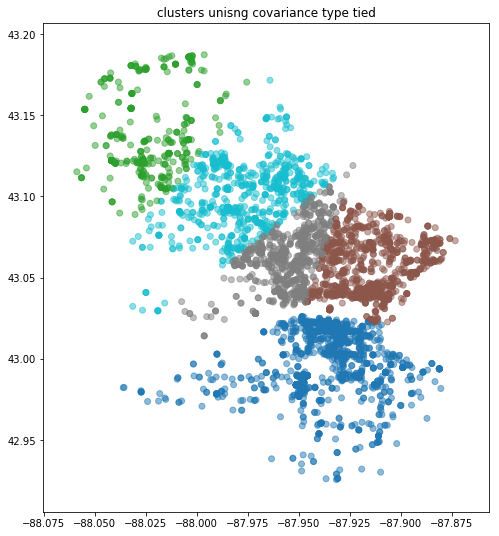

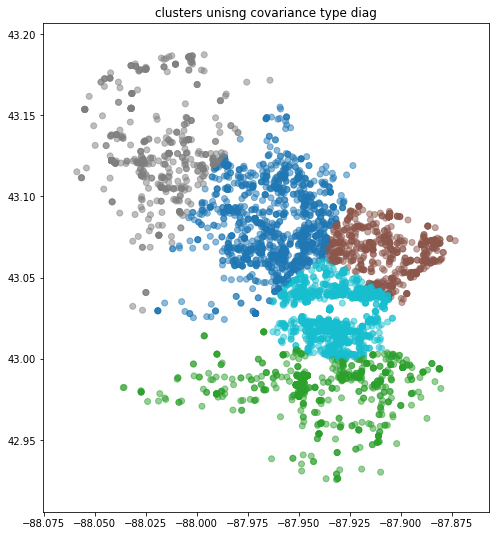

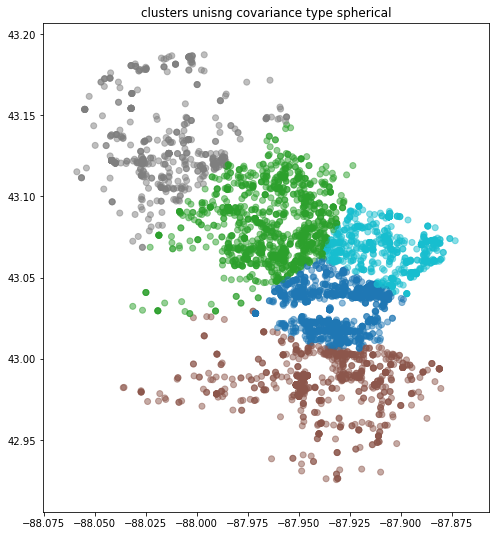

In [21]:
#plot all the data points in the csv excluding errors in year 2014 using the GaussianMixture model

ct= ['full', 'tied', 'diag', 'spherical']
for c in range (3, 6):
    print(c,'CLUSTERS:')
    for z in range (0,4):
        gm=GaussianMixture(n_components=c, covariance_type = ct[z]).fit(df14[['x_lng', 'y_lat']])
        cAssign=gm.predict(df14[['x_lng', 'y_lat']])
        plt.clf()
        plt.title('clusters unisng covariance type ' + ct[z])
        plt.scatter(df14['x_lng'],df14['y_lat'],c=cAssign,cmap='tab10', alpha=.5)
        plt.show()

In conclusion, I did not do GaussianMixture for months in 2009, 2010,2014 because there were not enough data points where it would be accurate.

## Compare and Value Counts

In [5]:
#count on violations
violation_count = df1["c_violation"].value_counts()
violation_count

Ordinance 106-1-1, Disorderly Conduct                               10842
Ordinance 110-35-1, Retail Theft                                     6461
Ordinance 105-138-2, Resisting / Obstructing Police Officer          4937
Ordinance 200 through 295, Building Code Violations                  4914
Ordinance 106-31-1, Loitering or Prowling                            4063
Ordinance 106-38-2, Possession of Marijuana                          3793
Ordinance 105-2, Assault and Battery                                 3550
Ordinance 110-10-1, Trespassing Upon Buildings / Premises            2856
Ordinance 110-15, Vandalism                                          2769
Ordinance 106-36-3-a, Possession of Drug Paraphernalia               1701
Ordinance 106-1.8-1, Public Drinking                                 1641
Ordinance 80-63-1, Excessive Noise Prohibited                        1418
Ordinance 110-16-2, Theft                                            1251
Ordinance 106-31-7, Loitering - Solici

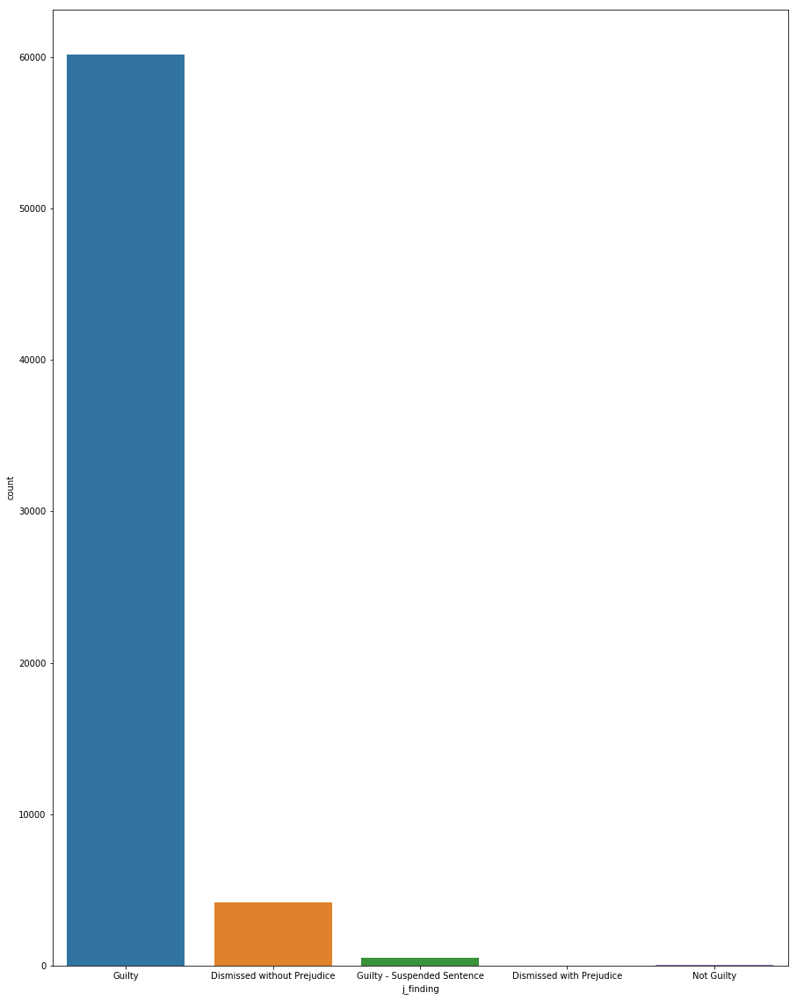

In [34]:
#compare crimes through the whole csv without errors

ax=sns.countplot(x=df1['j_finding'])

fig_size = plt.rcParams["figure.figsize"]      
fig_size[0] = 20
fig_size[1] = 20
plt.rcParams["figure.figsize"] = fig_size

plt.show()

In [11]:
#count on findings
finding_count = df1["j_finding"].value_counts()
finding_count

Guilty                         60136
Dismissed without Prejudice     4191
Guilty - Suspended Sentence      544
Not Guilty                        49
Dismissed with Prejudice          21
Name: j_finding, dtype: int64

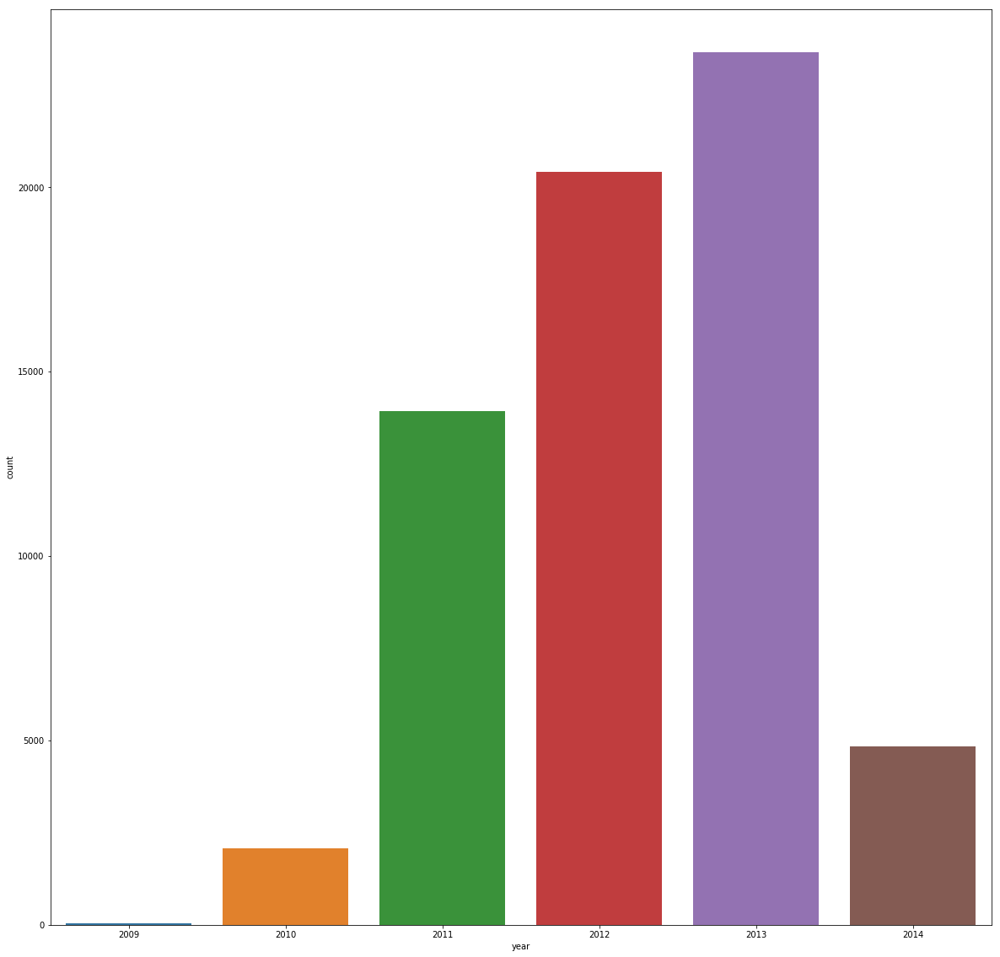

In [9]:
#make graph bigger
fig_size = plt.rcParams["figure.figsize"]      
fig_size[0] = 20
fig_size[1] = 20
plt.rcParams["figure.figsize"] = fig_size

#compare crimes per year

ax=sns.countplot(df1['year'])
plt.show()

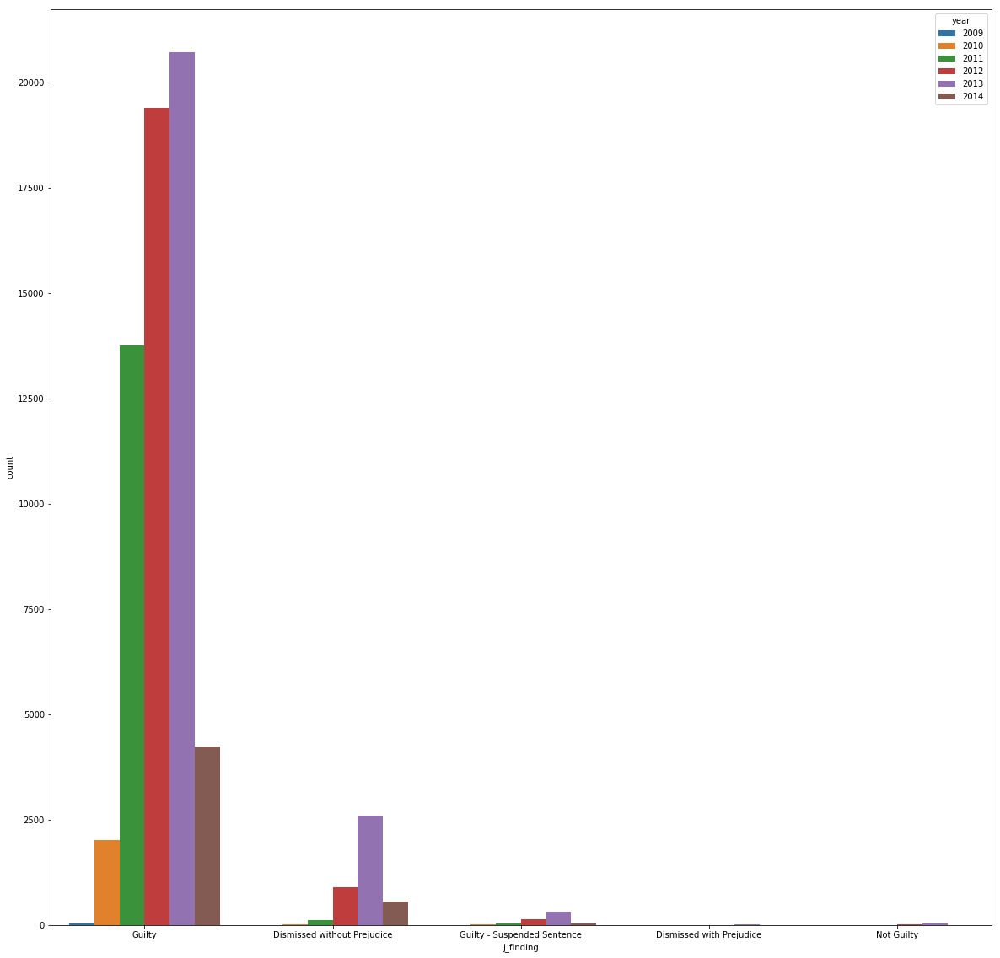

In [10]:
#compare sentence against each other per year

ax=sns.countplot(x=df1['j_finding'], hue=df1['year'])
plt.show()

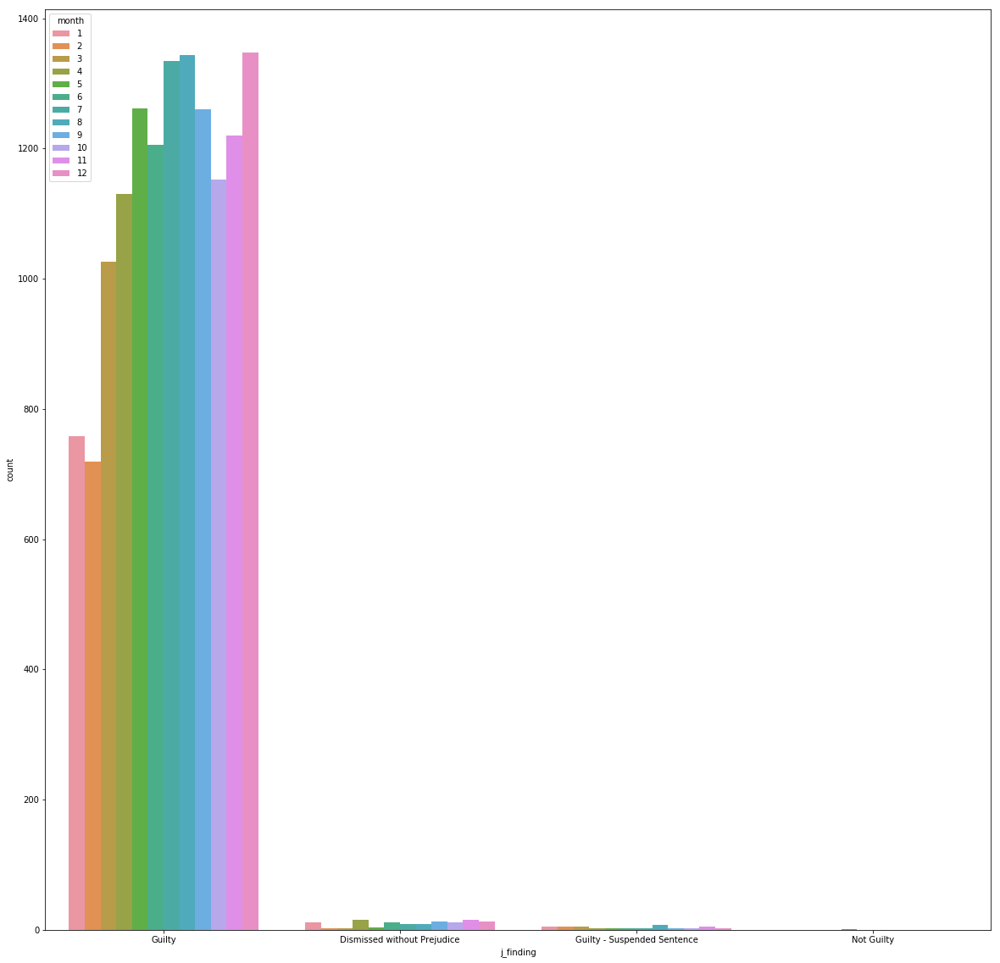

In [24]:
#compare sentence against each other per month in 2011

ax=sns.countplot(x=df11['j_finding'], hue=df11['month'])
plt.show()

In [26]:
#count on findings in 2011
finding_count = df11["j_finding"].value_counts()
finding_count

Guilty                         13759
Dismissed without Prejudice      120
Guilty - Suspended Sentence       45
Not Guilty                         1
Name: j_finding, dtype: int64

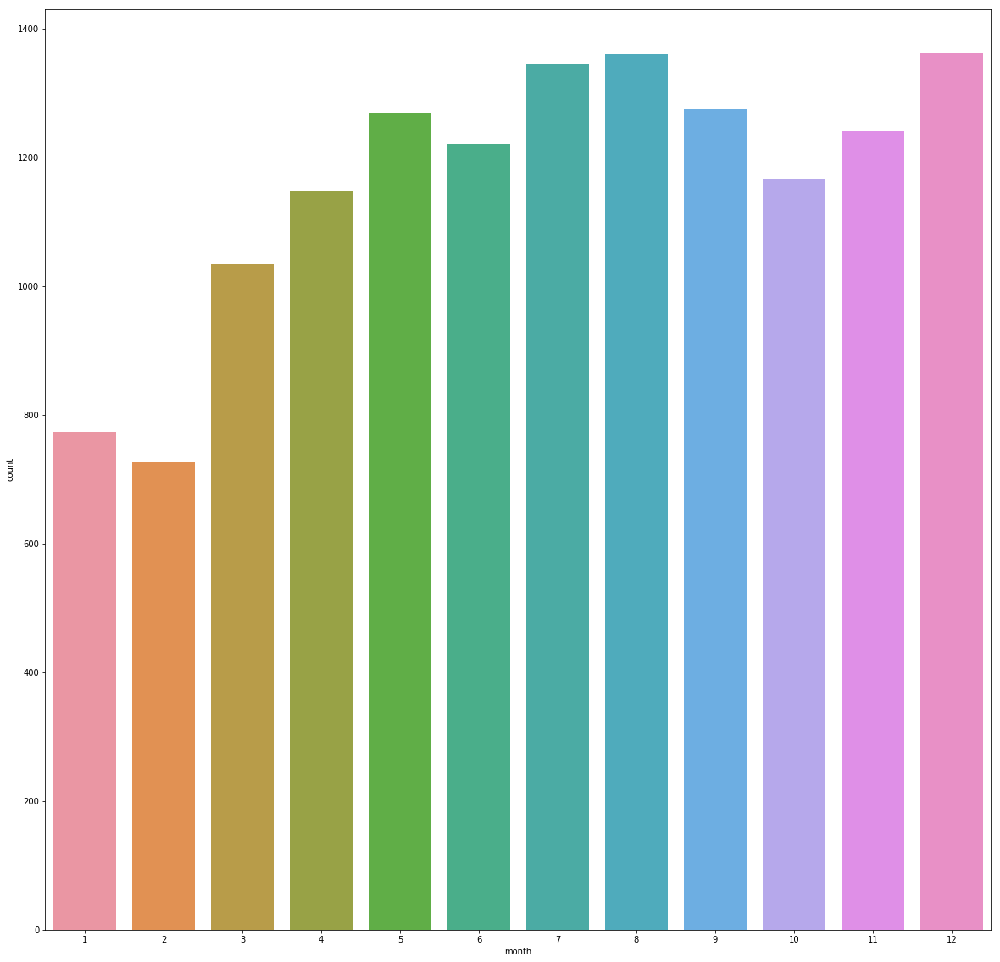

In [14]:
#compare crimes per month for 2011

ax=sns.countplot(df11['month'])
plt.show()

In [23]:
#count of crimes in 2011
finding_count = df11["month"].value_counts()
finding_count

12    1363
8     1361
7     1346
9     1275
5     1269
11    1241
6     1221
10    1167
4     1147
3     1034
1      774
2      727
Name: month, dtype: int64

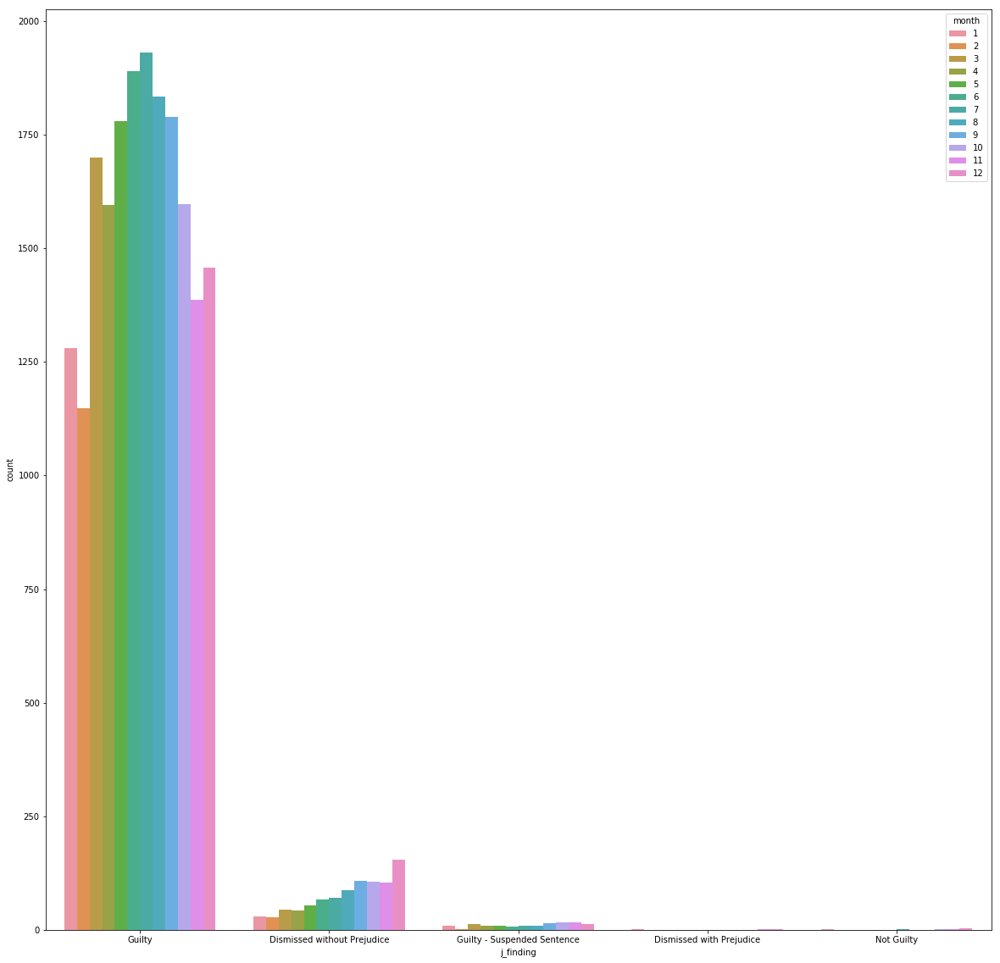

In [12]:
#compare sentence against each other per month in 2012

ax=sns.countplot(x=df12['j_finding'], hue=df12['month'])
plt.show()

In [22]:
#count on findings in 2012
finding_count = df12["j_finding"].value_counts()
finding_count

Guilty                         19387
Dismissed without Prejudice      893
Guilty - Suspended Sentence      128
Not Guilty                         8
Dismissed with Prejudice           4
Name: j_finding, dtype: int64

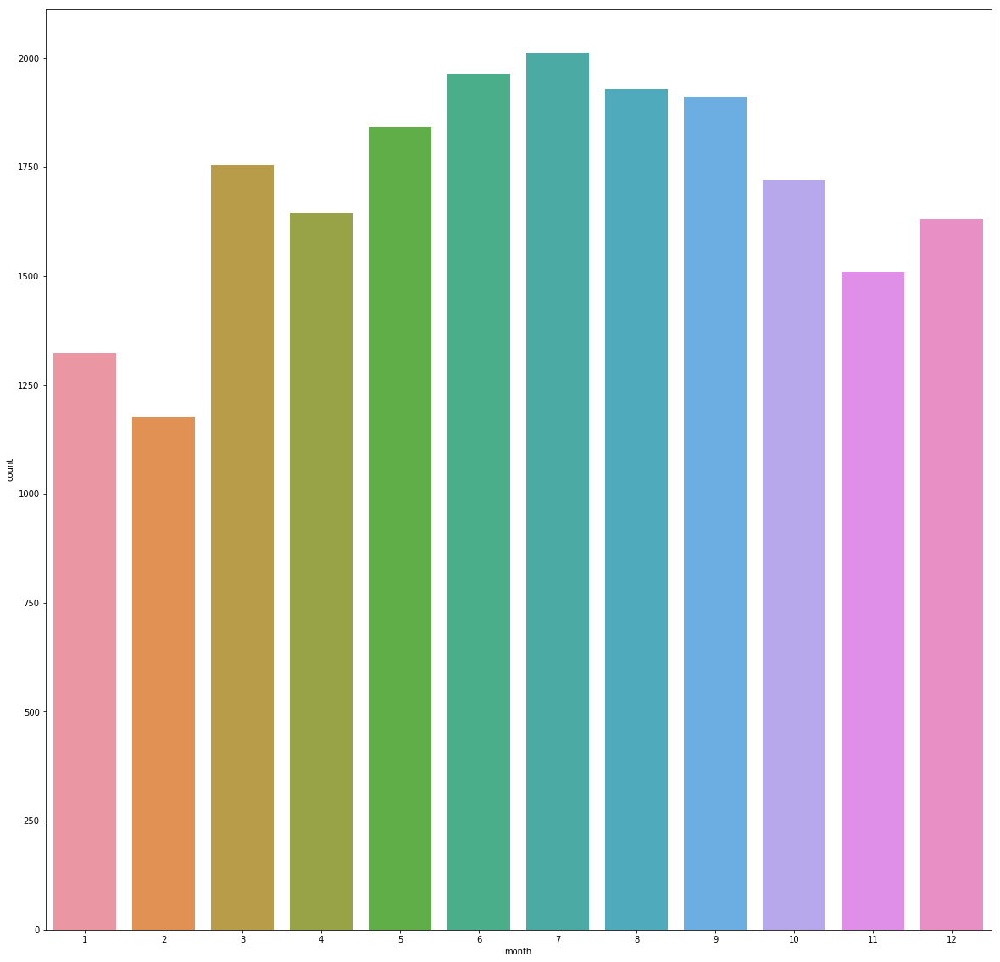

In [15]:
#compare crimes per month for 2012

ax=sns.countplot(df12['month'])
plt.show()

In [21]:
#count of crimes in 2012
finding_count = df12["month"].value_counts()
finding_count

7     2012
6     1964
8     1930
9     1912
5     1842
3     1755
10    1720
4     1646
12    1629
11    1509
1     1323
2     1178
Name: month, dtype: int64

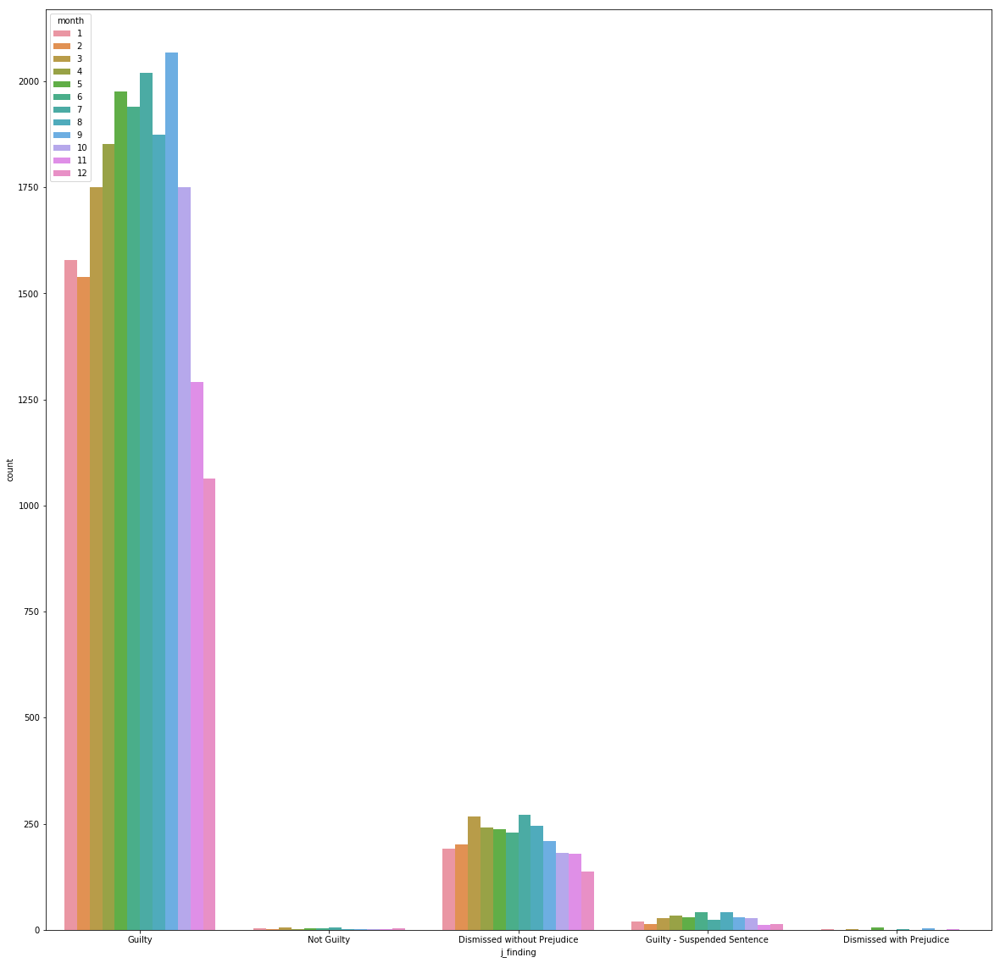

In [13]:
#compare sentence against each other per month in 2013

ax=sns.countplot(x=df13['j_finding'], hue=df13['month'])
plt.show()

In [20]:
#count on findings in 2013
finding_count = df13["j_finding"].value_counts()
finding_count

Guilty                         20703
Dismissed without Prejudice     2593
Guilty - Suspended Sentence      312
Not Guilty                        35
Dismissed with Prejudice          14
Name: j_finding, dtype: int64

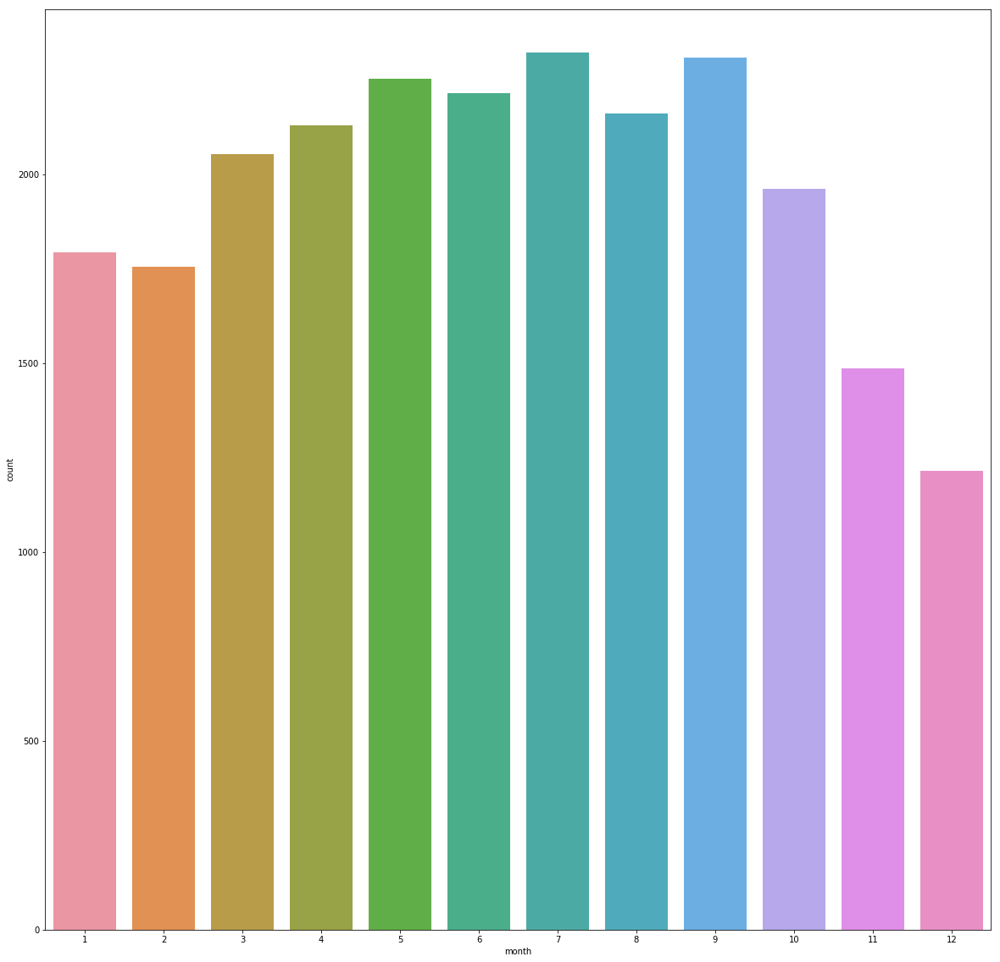

In [16]:
#compare crimes per month for 2013

ax=sns.countplot(df13['month'])
plt.show()

In [19]:
#count of crimes in 2013
finding_count = df13["month"].value_counts()
finding_count

7     2322
9     2310
5     2253
6     2215
8     2162
4     2129
3     2053
10    1962
1     1793
2     1756
11    1486
12    1216
Name: month, dtype: int64

In conclusion, I only did compare and count value for the overall data and data points in 2011, 2012, 2013. The compare and count values where for 'j_finding', 'year', 'month', and 'c_violation.' Also see in crimes by month that July has been the highest in crimes for two years.